# 1. Imports


1. Verify hd-bet works for PET images (try with and without skull)
     -> If not look at bet2
   
3. Try in Native space rather than MNI space
   
4. Try ADC if available

5. Expand Dataset
   
     -> Check unprocessed data, ADNI data (possibly ADNI for validation later)

6. Read literature and try different architectures
   
    -> Log metrics on test set after each experiment
        (SSIM, MSE, Inception score)

If use department GPU, make sure don't hog resources (esp if running overnight)

In [1]:
import matplotlib.pyplot as plt
import multiprocessing as mp
import nibabel as nib
import numpy as np
import os
import pandas as pd
import tempfile
from sklearn import metrics
import time
from time import time
import torch
import torch.nn as nn
import torch.nn.functional as F
from monai.networks.nets import AHNet
from tqdm import tqdm
import monai
from monai.utils import progress_bar
from monai.config import print_config
from monai.data import Dataset, DataLoader, CacheDataset
from monai.transforms import (
    Activations,
    AsDiscrete,
    Compose,
    EnsureChannelFirstd,
    EnsureTyped,
    LoadImaged,
    MapTransform,
    Orientationd,
    RandRicianNoised,
    RandRotated,
    RandFlipd,
    Resized,
    Rotate90d,
    ScaleIntensityd,
    DeleteItemsd,
    NormalizeIntensityd
)
from monai.losses.ssim_loss import SSIMLoss
import statistics

In [2]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="5,6,7"

In [3]:
%store -r dictionary_train
%store -r dictionary_valid
%store -r dictionary_test

# 2. MONAI Dataloader

In [4]:
#To turn 4D images to 3D (from Ashley's classifier)
class MakeSingleVolumed(MapTransform):
    def __call__(self, data):
        for key in self.keys:
            num_volumes = data[key].shape[0]
            data["NumVolumes"] = num_volumes
            
            if num_volumes != 1:
                middle_volume = num_volumes // 2
                new_data = np.empty((1,128,128,64))
                new_data[0,:,:,:] = data[key][middle_volume,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
            else:
                new_data = np.empty((1,128,128,64))
                new_data[0,:,:,:] = data[key][0,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
                
        return data

#This uses the mask to scale the intensity of the image (not being used rn)
class ScaleImaged(MapTransform):
    def __call__(self, data):
            data[self.keys[0]] *= (0.4+data[self.keys[1]])

            return data

In [5]:
train_transforms = Compose(
    [
        LoadImaged(keys=["t1", "t1c", "t2", "flair", "pet"], reader=monai.data.ITKReader, image_only=True),
        EnsureChannelFirstd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Orientationd(keys=["t1", "t1c", "t2", "flair", "pet"], axcodes="RAS"),        
        EnsureTyped(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Resized(keys=["t1", "t1c", "t2", "flair", "pet"], spatial_size=(128,128,64)),
        MakeSingleVolumed(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Rotate90d(keys=["t1", "t1c", "t2", "flair", "pet"]),
        RandFlipd(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.5, spatial_axis=1),
        RandRotated(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.6, range_z=0.3),
        ScaleIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        NormalizeIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"])
    ]
)

In [6]:
val_files = dictionary_train[:10]

check_ds = Dataset(data=val_files, transform=train_transforms)
check_DataLoader = DataLoader(check_ds, batch_size=1, shuffle=False)

It has been 15.551924228668213 seconds since the loop started


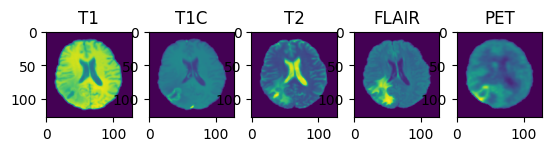

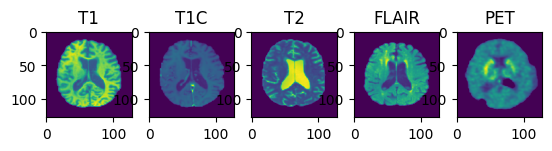

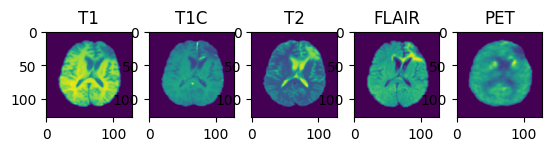

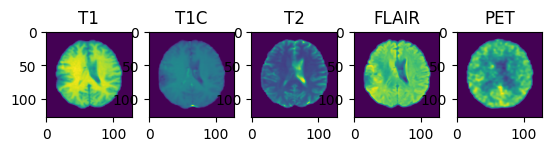

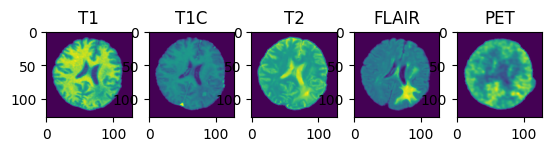

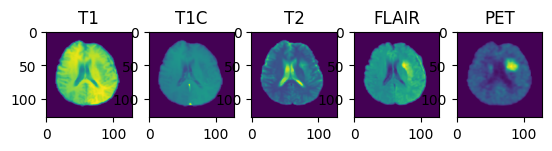

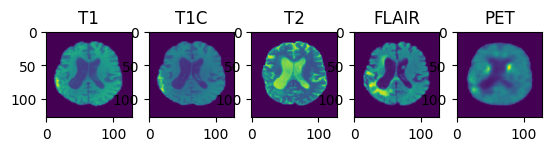

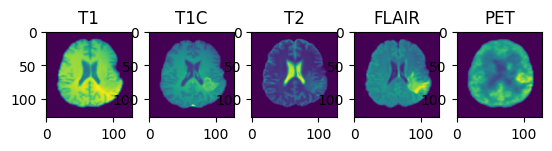

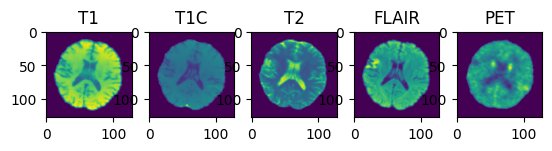

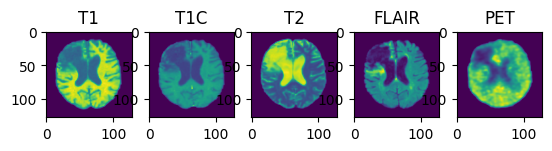

In [7]:
program_starts = time()
step = 1350
slice_index = 32
for item in check_DataLoader:
    image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index]
    
    f, axarr = plt.subplots(1, 5)
    
    axarr[0].imshow(image_datas[0])
    axarr[0].set_title("T1")
    axarr[1].imshow(image_datas[1])
    axarr[1].set_title("T1C")
    axarr[2].imshow(image_datas[2])
    axarr[2].set_title("T2")
    axarr[3].imshow(image_datas[3])
    axarr[3].set_title("FLAIR")
    axarr[4].imshow(image_datas[4])
    axarr[4].set_title("PET")
    
    step += 1
now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

In [8]:
print(os.cpu_count())

train_ds = CacheDataset(data=dictionary_train, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count(), drop_last=False)

valid_ds = CacheDataset(data=dictionary_valid, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
valid_loader = DataLoader(valid_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

test_ds = CacheDataset(data=dictionary_test, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

80


Loading dataset:   0%|                                  | 0/185 [00:00<?, ?it/s]

Loading dataset:   1%|▏                       | 1/185 [00:49<2:31:54, 49.54s/it]

Loading dataset:   1%|▎                       | 2/185 [00:50<1:04:38, 21.19s/it]

Loading dataset:   2%|▍                         | 3/185 [00:51<35:06, 11.57s/it]

Loading dataset:   2%|▌                         | 4/185 [01:01<33:48, 11.21s/it]

Loading dataset:   3%|▋                         | 5/185 [01:02<22:53,  7.63s/it]

Loading dataset:   3%|▊                         | 6/185 [01:03<15:28,  5.19s/it]

Loading dataset:   4%|▉                         | 7/185 [01:03<10:29,  3.54s/it]

Loading dataset:   4%|█                         | 8/185 [01:04<08:21,  2.83s/it]

Loading dataset:   5%|█▎                        | 9/185 [01:05<06:27,  2.20s/it]

Loading dataset:   5%|█▎                       | 10/185 [01:06<05:37,  1.93s/it]

Loading dataset:   6%|█▍                       | 11/185 [01:07<04:39,  1.60s/it]

Loading dataset:   6%|█▌                       | 12/185 [01:08<04:04,  1.41s/it]

Loading dataset:   7%|█▊                       | 13/185 [01:11<05:10,  1.81s/it]

Loading dataset:   8%|█▉                       | 14/185 [01:13<05:03,  1.77s/it]

Loading dataset:   8%|██                       | 15/185 [01:16<06:23,  2.25s/it]

Loading dataset:   9%|██▏                      | 16/185 [01:20<06:14,  2.22s/it]

Loading dataset:   9%|██▎                      | 17/185 [01:22<07:41,  2.74s/it]

Loading dataset:  10%|██▍                      | 18/185 [01:24<06:54,  2.48s/it]

Loading dataset:  10%|██▌                      | 19/185 [01:27<07:21,  2.66s/it]

Loading dataset:  11%|██▋                      | 20/185 [01:28<05:43,  2.08s/it]

Loading dataset:  11%|██▊                      | 21/185 [01:29<04:48,  1.76s/it]

Loading dataset:  12%|██▉                      | 22/185 [01:32<05:05,  1.88s/it]

Loading dataset:  12%|███                      | 23/185 [01:33<05:23,  1.99s/it]

Loading dataset:  13%|███▏                     | 24/185 [01:34<04:14,  1.58s/it]

Loading dataset:  14%|███▍                     | 25/185 [01:36<04:34,  1.71s/it]

Loading dataset:  44%|██████████▉              | 81/185 [01:38<00:11,  9.37it/s]

Loading dataset:  44%|███████████              | 82/185 [01:39<00:11,  8.79it/s]

Loading dataset:  45%|███████████▏             | 83/185 [01:39<00:12,  8.27it/s]

Loading dataset:  45%|███████████▎             | 84/185 [01:40<00:15,  6.37it/s]

Loading dataset:  46%|███████████▍             | 85/185 [01:40<00:16,  6.13it/s]

Loading dataset:  46%|███████████▌             | 86/185 [01:41<00:19,  5.07it/s]

Loading dataset:  47%|███████████▊             | 87/185 [01:41<00:25,  3.91it/s]

Loading dataset:  48%|███████████▉             | 88/185 [01:42<00:32,  2.96it/s]

Loading dataset:  48%|████████████             | 89/185 [01:43<00:40,  2.37it/s]

Loading dataset:  49%|████████████▏            | 90/185 [01:45<00:56,  1.69it/s]

Loading dataset:  49%|████████████▎            | 91/185 [01:46<01:08,  1.38it/s]

Loading dataset:  50%|████████████▍            | 92/185 [01:49<01:58,  1.27s/it]

Loading dataset:  50%|████████████▌            | 93/185 [01:50<01:44,  1.13s/it]

Loading dataset:  51%|████████████▋            | 94/185 [01:51<01:51,  1.22s/it]

Loading dataset:  56%|█████████████▍          | 104/185 [01:52<00:24,  3.34it/s]

Loading dataset:  57%|█████████████▌          | 105/185 [01:52<00:24,  3.30it/s]

Loading dataset:  57%|█████████████▊          | 106/185 [01:52<00:22,  3.49it/s]

Loading dataset:  58%|█████████████▉          | 107/185 [01:53<00:25,  3.02it/s]

Loading dataset:  87%|████████████████████▉   | 161/185 [01:53<00:00, 34.28it/s]

Loading dataset:  92%|██████████████████████  | 170/185 [01:53<00:00, 32.64it/s]

Loading dataset:  96%|██████████████████████▉ | 177/185 [01:53<00:00, 35.71it/s]

Loading dataset: 100%|████████████████████████| 185/185 [01:53<00:00,  1.62it/s]

Loading dataset:   0%|                                    | 0/5 [00:00<?, ?it/s]

Loading dataset:  20%|█████▌                      | 1/5 [00:03<00:12,  3.00s/it]

Loading dataset: 100%|████████████████████████████| 5/5 [00:03<00:00,  1.65it/s]

Loading dataset:   0%|                                   | 0/57 [00:00<?, ?it/s]

Loading dataset:   2%|▍                          | 1/57 [00:32<30:47, 32.98s/it]

Loading dataset:   4%|▉                          | 2/57 [00:33<12:32, 13.68s/it]

Loading dataset:  16%|████▎                      | 9/57 [00:33<01:37,  2.04s/it]

Loading dataset:  28%|███████▎                  | 16/57 [00:33<00:37,  1.08it/s]

Loading dataset:  39%|██████████                | 22/57 [00:33<00:19,  1.78it/s]

Loading dataset:  65%|████████████████▉         | 37/57 [00:33<00:04,  4.26it/s]

Loading dataset: 100%|██████████████████████████| 57/57 [00:33<00:00,  1.68it/s]

# 3. Model Setup


In [9]:
class GLA_Generator(nn.Module):
    def __init__(self):
        super(GLA_Generator, self).__init__()
        self.ahnet_global = AHNet(spatial_dims=3, in_channels=4, out_channels=16, pretrained=True)

        channels = [4, 6, 12, 6, 4]
        strides = [1, 1, 1, 1, 1]
        
        self.ahnet_1 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=4, channels=channels, strides=strides)
        self.ahnet_2 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=4, channels=channels, strides=strides)
        self.ahnet_3 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=4, channels=channels, strides=strides)
        self.ahnet_4 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=4, channels=channels, strides=strides)

        self.conv1 = nn.Conv3d(20, 16, kernel_size=1)
        self.bn1 = nn.BatchNorm3d(16)
        self.dropout = torch.nn.Dropout(0.2)
        self.conv2 = nn.Conv3d(16, 1, kernel_size=1)
        self.bn2 = nn.BatchNorm3d(1)

    def forward(self, x):
        batch_size, channels, width, height, depth = x.shape
        half_width, half_height = width // 2, height // 2
        
        # Splitting the input into 4 patches
        patch_1 = x[:, :, :half_width, :half_height, :]
        patch_2 = x[:, :, :half_width, half_height:, :]
        patch_3 = x[:, :, half_width:, :half_height, :]
        patch_4 = x[:, :, half_width:, half_height:, :]

        x = self.ahnet_global(x)
        patch_1 = self.ahnet_1(patch_1)
        patch_2 = self.ahnet_2(patch_2)
        patch_3 = self.ahnet_3(patch_3)
        patch_4 = self.ahnet_4(patch_4)

        # Concatenating the processed patches
        top_row = torch.cat([patch_1, patch_2], dim=3)  # Concatenate along the height
        bottom_row = torch.cat([patch_3, patch_4], dim=3)  # Concatenate along the height
        concatenated_patches = torch.cat([top_row, bottom_row], dim=2)  # Concatenate along the width

        x = torch.cat([x, concatenated_patches], dim=1)

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.dropout(x)
        x = self.conv2(x)
        x = self.bn2(x)

        return x

### 3.1 Model and Device Setup

In [10]:
# Use GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

gen_net = GLA_Generator()

disc_net = monai.networks.nets.Discriminator(
    in_shape=(128, 128, 64),
    channels=(8, 16, 32, 64, 128, 64, 1),
    strides=(2, 2, 2, 2, 2, 1, 1),
    num_res_units=1,
    kernel_size=3,
)

# If multiple GPUs are available, run in parallel
if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    gen_net = nn.DataParallel(gen_net)
    disc_net = nn.DataParallel(disc_net)

gen_net.to(device)
disc_net.to(device)

real_label = 1
gen_label = 0

disc_loss = torch.nn.BCELoss()
gen_loss = torch.nn.BCELoss()
gen_loss2 = monai.metrics.MultiScaleSSIMMetric(spatial_dims=3, kernel_size=4)

disc_opt = torch.optim.Adam(disc_net.parameters(), 0.00005)
gen_opt = torch.optim.Adam(gen_net.parameters(), 0.0002)

def discriminator_loss(gen_images, real_images):
    """
    The discriminator loss if calculated by comparing its
    prediction for real and generated images.

    """
    real = real_images.new_full((real_images.shape[0], 1), real_label)
    gen = gen_images.new_full((gen_images.shape[0], 1), gen_label)

    # Training discriminator to label 1 on real images
    realloss = disc_loss(disc_net(real_images), real) 

    # Training discriminator to label 0 on generated images
    genloss = disc_loss(disc_net(gen_images.detach()), gen)

    return (realloss + genloss) / 2


def generator_loss(input, real_images):
    """
    The generator loss is calculated by determining how well
    the discriminator was fooled by the generated images.

    """
    output = disc_net(input[:,0,:,:,:])
    cats = output.new_full(output.shape, real_label)
    fooling_disc = gen_loss(output, cats)
    ssim = 1 - torch.mean(gen_loss2(input, real_images))
    
    # Train generator to fool the discriminator into giving a score of 1, and to have a high SSIM
    return (2*fooling_disc) + ssim

cuda


The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.


Let's use 3 GPUs!


### 3.2 Training


----------
epoch 1/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:20, 61.90s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.45s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:25, 16.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.94s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.27s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.15s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.42s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.91s/it]

----------
epoch 2/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:29, 62.70s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:35, 27.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.26s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:27, 10.98s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.06s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:25,  5.19s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.45s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.95s/it]

----------
epoch 3/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:49, 59.04s/it]

Epoch :  17%|██████                              | 2/12 [01:01<04:20, 26.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:04<02:18, 15.44s/it]

Epoch :  33%|████████████                        | 4/12 [01:07<01:23, 10.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:10<00:54,  7.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:36,  6.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.06s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:29<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.68s/it]

----------
epoch 4/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:00, 60.06s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:24, 26.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:22, 15.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:25, 10.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:55,  7.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:37,  6.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.09s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.38s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.91s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.58s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.74s/it]

----------
epoch 5/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:50, 59.14s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:20, 26.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:04<02:19, 15.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:07<01:23, 10.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:10<00:54,  7.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:37,  6.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.09s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.38s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.90s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.58s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.36s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:29<00:00,  2.84s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.67s/it]

----------
epoch 6/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:58<10:45, 58.71s/it]

Epoch :  17%|██████                              | 2/12 [01:01<04:20, 26.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:04<02:19, 15.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:07<01:23, 10.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:10<00:54,  7.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:36,  6.08s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.34s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.62s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:27<00:03,  3.39s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:29<00:00,  2.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  7.63s/it]

----------
epoch 7/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:57<10:30, 57.31s/it]

Epoch :  17%|██████                              | 2/12 [01:00<04:12, 25.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:03<02:15, 15.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:05<01:21, 10.24s/it]

Epoch :  42%|███████████████                     | 5/12 [01:09<00:53,  7.69s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:11<00:36,  6.04s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:14<00:25,  5.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:17<00:17,  4.32s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:20<00:11,  3.86s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:23<00:07,  3.55s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:26<00:03,  3.34s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:28<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  7.53s/it]

----------
epoch 8/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:00, 60.05s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:24, 26.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:20, 15.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:24, 10.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.82s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:36,  6.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.07s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.71s/it]

----------
epoch 9/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:51, 59.24s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:20, 26.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:20, 15.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:24, 10.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:10<00:54,  7.80s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:36,  6.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.35s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.88s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.56s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.69s/it]

----------
epoch 10/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:22, 62.00s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:32, 27.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:25, 16.15s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.93s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:38,  6.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.94s/it]

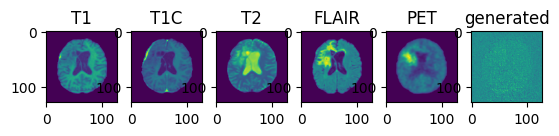

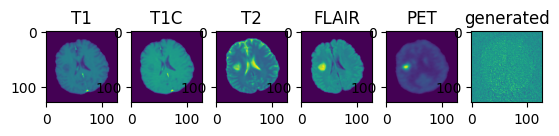

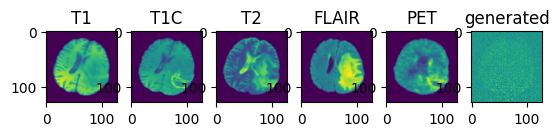

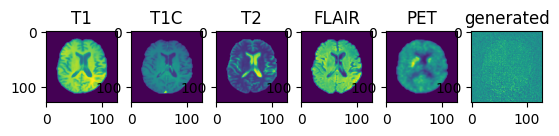

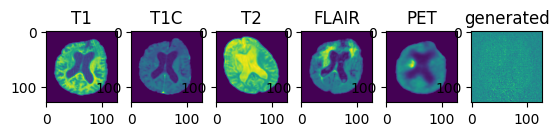

validation avg MS-SSIM: 0.1512
----------
epoch 11/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:09, 60.88s/it]

Epoch :  17%|██████                              | 2/12 [01:03<04:27, 26.77s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:24, 16.03s/it]

Epoch :  33%|████████████                        | 4/12 [01:09<01:26, 10.84s/it]

Epoch :  42%|███████████████                     | 5/12 [01:12<00:55,  7.96s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:37,  6.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:18<00:25,  5.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:21<00:17,  4.42s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:24<00:11,  3.93s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.60s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.90s/it]

----------
epoch 12/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:57, 59.77s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:23, 26.31s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:20, 15.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:24, 10.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.80s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:36,  6.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.43s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.94s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.61s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.70s/it]

----------
epoch 13/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:55, 59.62s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:24, 26.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:20, 15.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:24, 10.60s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:36,  6.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.07s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.37s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.89s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.72s/it]

----------
epoch 14/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:50, 59.14s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:20, 26.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:04<02:19, 15.46s/it]

Epoch :  33%|████████████                        | 4/12 [01:07<01:23, 10.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:10<00:54,  7.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:37,  6.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.10s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.39s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.91s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.59s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:29<00:00,  2.85s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  7.64s/it]

----------
epoch 15/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:58<10:38, 58.05s/it]

Epoch :  17%|██████                              | 2/12 [01:00<04:16, 25.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:03<02:17, 15.23s/it]

Epoch :  33%|████████████                        | 4/12 [01:06<01:22, 10.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:09<00:53,  7.66s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:12<00:36,  6.04s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:15<00:25,  5.00s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:18<00:17,  4.32s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:21<00:11,  3.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:24<00:07,  3.61s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:27<00:03,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:28<00:00,  2.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  7.60s/it]

----------
epoch 16/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:52, 59.30s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:21, 26.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:19, 15.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:07<01:24, 10.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:55,  7.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:37,  6.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.10s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.39s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.92s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.59s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.68s/it]

----------
epoch 17/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:49, 59.01s/it]

Epoch :  17%|██████                              | 2/12 [01:01<04:19, 26.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:04<02:19, 15.46s/it]

Epoch :  33%|████████████                        | 4/12 [01:07<01:24, 10.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:10<00:54,  7.78s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:36,  6.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.62s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:29<00:00,  2.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.68s/it]

----------
epoch 18/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:58, 59.83s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:23, 26.32s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:21, 15.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:25, 10.66s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.85s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:36,  6.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.08s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.37s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.90s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.58s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.72s/it]

----------
epoch 19/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:54, 59.46s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:22, 26.22s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:20, 15.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:24, 10.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.78s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:37,  6.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.41s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.92s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.60s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.85s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.69s/it]

----------
epoch 20/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:53, 59.45s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:24, 26.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:21, 15.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:24, 10.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.82s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:36,  6.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.07s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.37s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.90s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.69s/it]

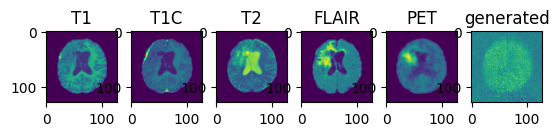

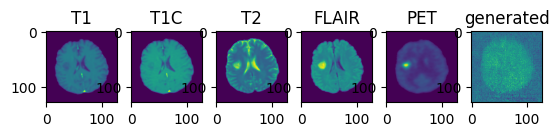

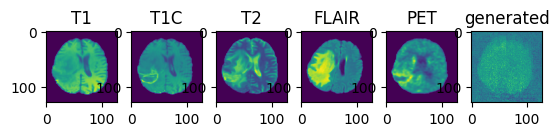

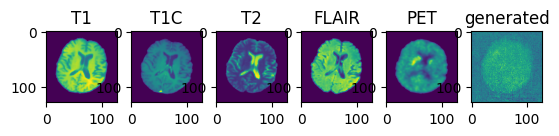

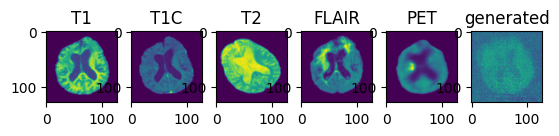

validation avg MS-SSIM: 0.3567
----------
epoch 21/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:08, 60.76s/it]

Epoch :  17%|██████                              | 2/12 [01:03<04:27, 26.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:22, 15.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:09<01:25, 10.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:12<00:55,  7.89s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:37,  6.21s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:18<00:26,  5.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:21<00:17,  4.49s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:24<00:11,  3.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  7.80s/it]

----------
epoch 22/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:02, 60.22s/it]

Epoch :  17%|██████                              | 2/12 [01:03<04:26, 26.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:22, 15.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:09<01:25, 10.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:12<00:55,  7.87s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:37,  6.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.09s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.39s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.91s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  7.79s/it]

----------
epoch 23/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:01, 60.10s/it]

Epoch :  17%|██████                              | 2/12 [01:03<04:24, 26.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:21, 15.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:25, 10.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:37,  6.26s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.44s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  7.78s/it]

----------
epoch 24/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:29, 62.68s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:35, 27.53s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.00s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:25,  5.19s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.97s/it]

----------
epoch 25/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:53, 59.39s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:21, 26.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:19, 15.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:25, 10.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:55,  7.89s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:37,  6.18s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.12s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.41s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.94s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.61s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.72s/it]

----------
epoch 26/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:55, 59.57s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:22, 26.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:20, 15.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:24, 10.56s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.79s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:36,  6.12s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.05s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.45s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.61s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.68s/it]

----------
epoch 27/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:43, 63.99s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.23s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:17,  4.49s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:11,  3.98s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.08s/it]

----------
epoch 28/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:18, 61.68s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:31, 27.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:24, 16.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:26, 10.86s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:55,  7.98s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:38,  6.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:18,  4.54s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.90s/it]

----------
epoch 29/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:28, 62.56s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:36, 27.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.34s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.01s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:25,  5.19s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.45s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.95s/it]

----------
epoch 30/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:58<10:45, 58.72s/it]

Epoch :  17%|██████                              | 2/12 [01:01<04:18, 25.88s/it]

Epoch :  25%|█████████                           | 3/12 [01:04<02:18, 15.37s/it]

Epoch :  33%|████████████                        | 4/12 [01:07<01:23, 10.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:10<00:54,  7.82s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:36,  6.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.06s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.37s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:21<00:11,  3.89s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:24<00:07,  3.57s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:27<00:03,  3.35s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:29<00:00,  2.84s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  7.60s/it]

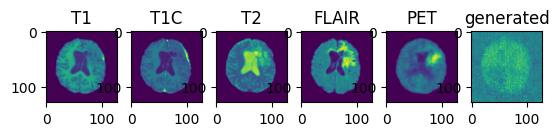

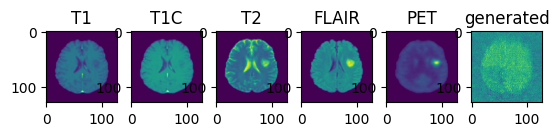

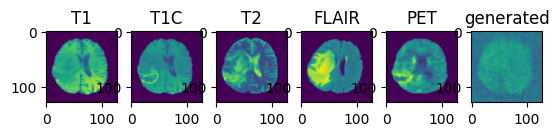

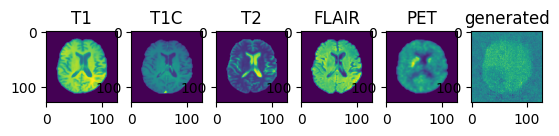

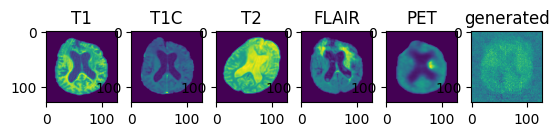

validation avg MS-SSIM: 0.3242
----------
epoch 31/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:23, 62.10s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:32, 27.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:25, 16.13s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.91s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:57,  8.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:38,  6.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:26,  5.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.93s/it]

----------
epoch 32/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:13, 61.20s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:28, 26.88s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:23, 15.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:09<01:26, 10.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:12<00:55,  7.91s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:37,  6.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:18<00:25,  5.10s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:21<00:17,  4.39s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:24<00:11,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.86s/it]

----------
epoch 33/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:11, 61.03s/it]

Epoch :  17%|██████                              | 2/12 [01:03<04:28, 26.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:23, 15.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.91s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:37,  6.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:18<00:26,  5.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:21<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:24<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.88s/it]

----------
epoch 34/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:00, 60.07s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:24, 26.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:21, 15.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:24, 10.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:36,  6.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.08s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.48s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.98s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.73s/it]

----------
epoch 35/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:00, 60.00s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:24, 26.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:22, 15.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:25, 10.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:55,  7.90s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:37,  6.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.10s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.40s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.92s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.59s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.74s/it]

----------
epoch 36/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:05, 60.48s/it]

Epoch :  17%|██████                              | 2/12 [01:03<04:25, 26.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:21, 15.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:09<01:25, 10.67s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.85s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:36,  6.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.17s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.44s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.94s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.61s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  2.85s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  7.77s/it]

----------
epoch 37/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:58<10:47, 58.82s/it]

Epoch :  17%|██████                              | 2/12 [01:01<04:19, 25.91s/it]

Epoch :  25%|█████████                           | 3/12 [01:04<02:19, 15.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:07<01:24, 10.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:10<00:54,  7.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:36,  6.10s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.34s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.88s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:27<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:29<00:00,  2.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  7.65s/it]

----------
epoch 38/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:46, 64.18s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.13s/it]

----------
epoch 39/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:52, 70.26s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:06, 30.64s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:41, 17.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:36, 12.03s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:01,  8.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:40,  6.76s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:27,  5.49s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:18,  4.67s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.20s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:39<00:03,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.63s/it]

----------
epoch 40/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:11, 66.51s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:51, 29.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:12<02:34, 17.16s/it]

Epoch :  33%|████████████                        | 4/12 [01:15<01:33, 11.68s/it]

Epoch :  42%|███████████████                     | 5/12 [01:18<00:59,  8.52s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:21<00:39,  6.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:27,  5.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:30<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  8.40s/it]

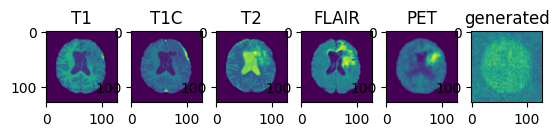

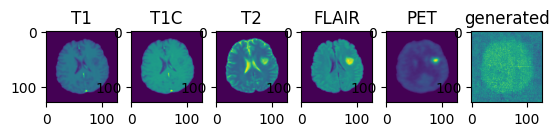

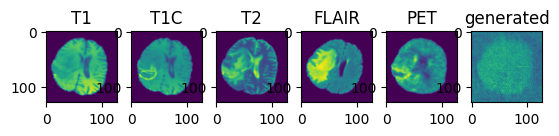

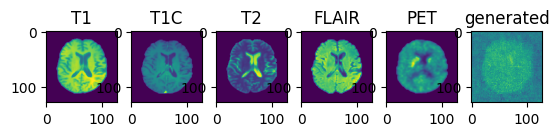

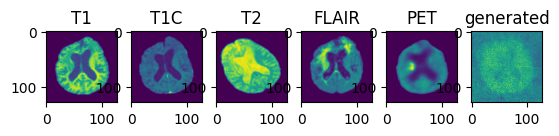

validation avg MS-SSIM: 0.3266
----------
epoch 41/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:05, 65.98s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:48, 28.88s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.02s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.45s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:59,  8.50s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.60s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.39s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.59s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.26s/it]

----------
epoch 42/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:51, 59.26s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:20, 26.08s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:19, 15.49s/it]

Epoch :  33%|████████████                        | 4/12 [01:07<01:24, 10.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:10<00:54,  7.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:36,  6.09s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.03s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.42s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.93s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:25<00:07,  3.60s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:29<00:00,  2.85s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.67s/it]

----------
epoch 43/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:00, 60.02s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:24, 26.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:22, 15.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:25, 10.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:55,  7.88s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:37,  6.17s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.09s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.38s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.90s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.58s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  7.78s/it]

----------
epoch 44/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:58<10:47, 58.83s/it]

Epoch :  17%|██████                              | 2/12 [01:01<04:19, 25.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:04<02:18, 15.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:07<01:23, 10.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:10<00:54,  7.71s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:13<00:36,  6.07s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:16<00:25,  5.12s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:19<00:17,  4.40s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:22<00:11,  3.92s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:24<00:07,  3.59s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:27<00:03,  3.36s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:29<00:00,  2.85s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  7.62s/it]

----------
epoch 45/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:02, 60.19s/it]

Epoch :  17%|██████                              | 2/12 [01:03<04:25, 26.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:22, 15.88s/it]

Epoch :  33%|████████████                        | 4/12 [01:09<01:26, 10.75s/it]

Epoch :  42%|███████████████                     | 5/12 [01:12<00:55,  7.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:37,  6.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.11s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.39s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.92s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.59s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  7.79s/it]

----------
epoch 46/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:58, 59.90s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:23, 26.35s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:20, 15.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:24, 10.60s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.82s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:37,  6.24s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.13s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.41s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.92s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.59s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:28<00:03,  3.37s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.73s/it]

----------
epoch 47/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:03, 60.33s/it]

Epoch :  17%|██████                              | 2/12 [01:03<04:27, 26.74s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:22, 15.84s/it]

Epoch :  33%|████████████                        | 4/12 [01:09<01:25, 10.72s/it]

Epoch :  42%|███████████████                     | 5/12 [01:12<00:55,  7.89s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:37,  6.19s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.11s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.40s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.93s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  7.78s/it]

----------
epoch 48/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:14, 61.33s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:29, 26.97s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:23, 15.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:26, 10.81s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:57,  8.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:42,  7.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:31,  6.21s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:28<00:23,  5.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:17,  5.85s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:11,  5.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:05,  5.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  4.83s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.42s/it]

----------
epoch 49/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:22<15:05, 82.30s/it]

Epoch :  17%|██████                              | 2/12 [01:25<05:55, 35.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:28<03:06, 20.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:30<01:49, 13.65s/it]

Epoch :  42%|███████████████                     | 5/12 [01:33<01:08,  9.76s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:44,  7.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.38s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:55<00:00,  9.59s/it]

----------
epoch 50/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:12, 61.09s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:28, 26.87s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:23, 15.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.94s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:18<00:25,  5.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:21<00:17,  4.45s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:24<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.87s/it]

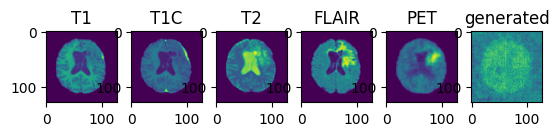

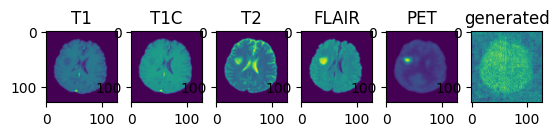

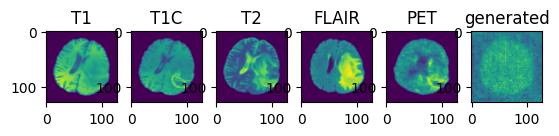

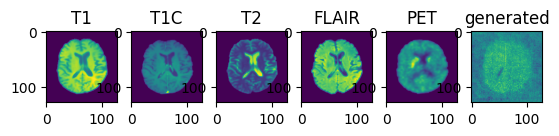

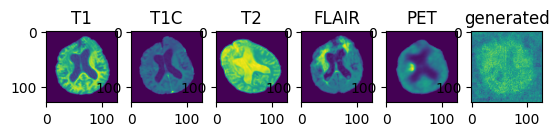

validation avg MS-SSIM: 0.3172
----------
epoch 51/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:51, 64.71s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:43, 28.38s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:31, 11.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.36s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.34s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.16s/it]

----------
epoch 52/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [00:59<10:59, 59.96s/it]

Epoch :  17%|██████                              | 2/12 [01:02<04:23, 26.39s/it]

Epoch :  25%|█████████                           | 3/12 [01:05<02:20, 15.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:08<01:25, 10.63s/it]

Epoch :  42%|███████████████                     | 5/12 [01:11<00:54,  7.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:14<00:36,  6.16s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:17<00:25,  5.19s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:20<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:23<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:26<00:07,  3.62s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:29<00:03,  3.39s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:30<00:00,  2.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  7.74s/it]

----------
epoch 53/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:54, 64.98s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:44, 28.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.04s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.47s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.39s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.39s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.62s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.73s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.28s/it]

----------
epoch 54/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:41, 69.25s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:03, 30.30s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:40, 17.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:35, 11.97s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:01,  8.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:41,  6.92s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:28,  5.62s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:19,  4.76s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.19s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:39<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.63s/it]

----------
epoch 55/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:48, 69.89s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:07, 30.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:42, 18.09s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:36, 12.12s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:01,  8.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:40,  6.83s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:27,  5.56s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:18,  4.72s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:40<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  8.69s/it]

----------
epoch 56/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:07, 66.12s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:51, 29.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:12<02:35, 17.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:15<01:32, 11.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:18<01:00,  8.62s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:21<00:40,  6.71s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:27,  5.48s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.70s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:30<00:12,  4.18s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  3.19s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  8.43s/it]

----------
epoch 57/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:31, 73.76s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.04s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.71s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.34s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.94s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.01s/it]

----------
epoch 58/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:08<12:35, 68.68s/it]

Epoch :  17%|██████                              | 2/12 [01:11<05:00, 30.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:42, 18.03s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:36, 12.09s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:01,  8.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:40,  6.83s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:27,  5.55s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:18,  4.73s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.18s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.78s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:39<00:03,  3.79s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.66s/it]

----------
epoch 59/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<13:00, 70.98s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.99s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.85s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.74s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.83s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.28s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.80s/it]

----------
epoch 60/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:15, 72.33s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:15, 31.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:48, 18.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.06s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:41,  6.98s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.65s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.79s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.19s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.88s/it]

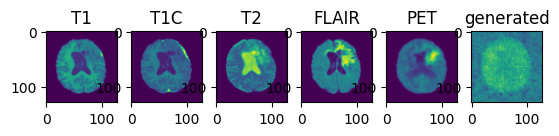

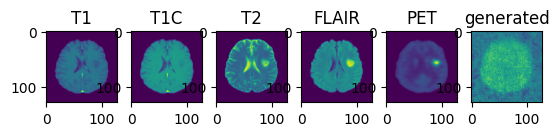

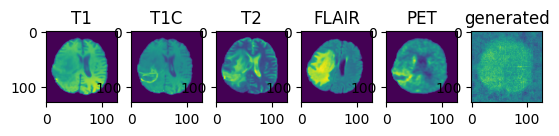

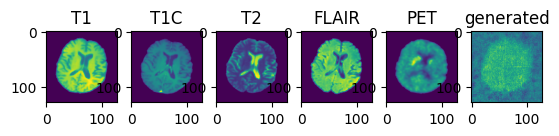

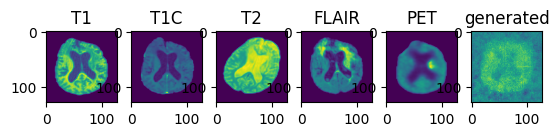

validation avg MS-SSIM: 0.3295
----------
epoch 61/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:08<12:28, 68.02s/it]

Epoch :  17%|██████                              | 2/12 [01:11<04:59, 30.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:14<02:38, 17.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:17<01:34, 11.84s/it]

Epoch :  42%|███████████████                     | 5/12 [01:20<01:00,  8.63s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:23<00:40,  6.68s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:26<00:27,  5.45s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:28<00:18,  4.66s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:31<00:12,  4.13s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:35<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:38<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  8.52s/it]

----------
epoch 62/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.79s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.35s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.34s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:04,  9.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.72s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.84s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.26s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.88s/it]

----------
epoch 63/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:21, 72.89s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:17, 31.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.03s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.74s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.88s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:13,  4.45s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:08,  4.00s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.96s/it]

----------
epoch 64/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:41, 74.68s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:25, 32.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:51, 19.04s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.68s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:05,  9.33s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.14s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:28,  5.78s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.09s/it]

----------
epoch 65/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:41, 69.19s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:02, 30.27s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:40, 17.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:35, 11.97s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:01,  8.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:40,  6.77s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:27,  5.52s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:19,  4.81s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.24s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:39<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.63s/it]

----------
epoch 66/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:08<12:38, 68.93s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:01, 30.20s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:40, 17.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:36, 12.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:01,  8.81s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:40,  6.82s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:27,  5.56s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:18,  4.72s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.17s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:39<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  3.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.64s/it]

----------
epoch 67/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:08<12:31, 68.35s/it]

Epoch :  17%|██████                              | 2/12 [01:11<04:59, 29.93s/it]

Epoch :  25%|█████████                           | 3/12 [01:14<02:38, 17.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:17<01:34, 11.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:20<01:00,  8.66s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:23<00:40,  6.70s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:26<00:27,  5.48s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:29<00:18,  4.67s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:32<00:12,  4.13s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:35<00:07,  3.77s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:38<00:03,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  8.56s/it]

----------
epoch 68/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:55, 70.53s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:08, 30.81s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.41s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.31s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.93s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.88s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:27,  5.60s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:18,  4.75s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:12,  4.19s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.82s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.76s/it]

----------
epoch 69/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<13:00, 70.94s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.99s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.24s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:37, 12.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.94s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.06s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.75s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.28s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.80s/it]

----------
epoch 70/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:36, 74.21s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:25, 32.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:51, 19.08s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.74s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:12,  4.31s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:08,  4.04s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.16s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.11s/it]

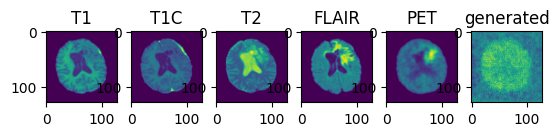

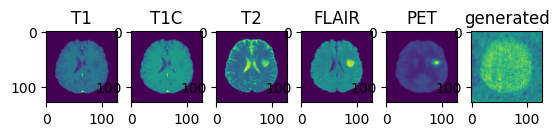

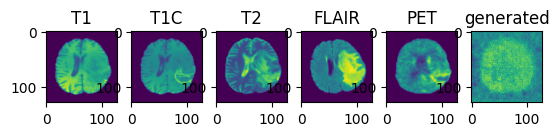

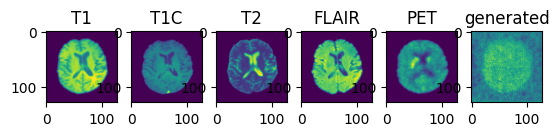

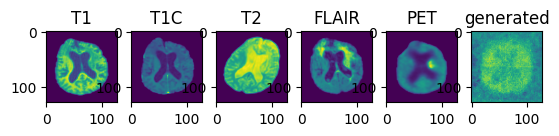

validation avg MS-SSIM: 0.3188
----------
epoch 71/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:35, 74.11s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:23, 32.39s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:51, 19.01s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.81s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.90s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.72s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.09s/it]

----------
epoch 72/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:36, 74.26s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:23, 32.34s/it]

Epoch :  25%|█████████                           | 3/12 [01:20<02:50, 18.95s/it]

Epoch :  33%|████████████                        | 4/12 [01:23<01:41, 12.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:26<01:04,  9.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:43,  7.22s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:29,  5.85s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.37s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.69s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.17s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.15s/it]

----------
epoch 73/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:37, 79.79s/it]

Epoch :  17%|██████                              | 2/12 [01:23<05:49, 34.99s/it]

Epoch :  25%|█████████                           | 3/12 [01:26<03:03, 20.43s/it]

Epoch :  33%|████████████                        | 4/12 [01:29<01:48, 13.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:08,  9.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:35<00:45,  7.56s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:30,  6.10s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.52s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.20s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.24s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 74/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:19<14:31, 79.24s/it]

Epoch :  17%|██████                              | 2/12 [01:22<05:44, 34.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:25<03:00, 20.07s/it]

Epoch :  33%|████████████                        | 4/12 [01:28<01:46, 13.34s/it]

Epoch :  42%|███████████████                     | 5/12 [01:32<01:11, 10.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:36<00:46,  7.81s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:39<00:31,  6.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:42<00:21,  5.28s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:45<00:13,  4.61s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:48<00:08,  4.15s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:51<00:03,  3.84s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  3.22s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:56<00:00,  9.70s/it]

----------
epoch 75/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:21, 78.34s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:41, 34.10s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.96s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:46, 13.28s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:07,  9.58s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:33<00:44,  7.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:36<00:29,  5.98s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:39<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.56s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.06s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.74s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.20s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:54<00:00,  9.51s/it]

----------
epoch 76/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:18<14:18, 78.01s/it]

Epoch :  17%|██████                              | 2/12 [01:21<05:39, 33.93s/it]

Epoch :  25%|█████████                           | 3/12 [01:24<02:59, 19.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:27<01:47, 13.47s/it]

Epoch :  42%|███████████████                     | 5/12 [01:30<01:08,  9.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:34<00:44,  7.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:37<00:30,  6.04s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:40<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:43<00:13,  4.47s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:46<00:08,  4.03s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:49<00:03,  3.73s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:51<00:00,  3.13s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:53<00:00,  9.50s/it]

----------
epoch 77/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:14<13:34, 74.01s/it]

Epoch :  17%|██████                              | 2/12 [01:17<05:22, 32.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.87s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.61s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.73s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:38<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:41<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:44<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.03s/it]

----------
epoch 78/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:52, 75.70s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:29, 32.94s/it]

Epoch :  25%|█████████                           | 3/12 [01:21<02:53, 19.26s/it]

Epoch :  33%|████████████                        | 4/12 [01:25<01:44, 13.03s/it]

Epoch :  42%|███████████████                     | 5/12 [01:28<01:06,  9.53s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:31<00:44,  7.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:34<00:29,  5.94s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:37<00:19,  4.99s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:40<00:13,  4.36s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:43<00:07,  3.95s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:46<00:03,  3.68s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:52<00:00,  9.35s/it]

----------
epoch 79/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:18, 72.57s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.57s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.45s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.06s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.01s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.68s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.90s/it]

----------
epoch 80/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:10, 71.85s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.30s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:38, 12.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.95s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.91s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.61s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.79s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.84s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.83s/it]

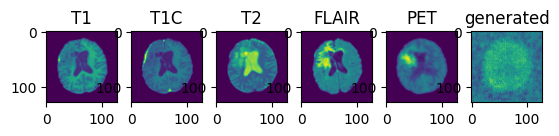

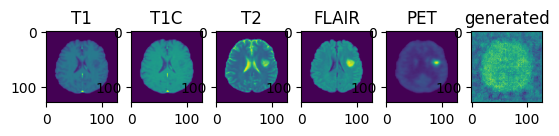

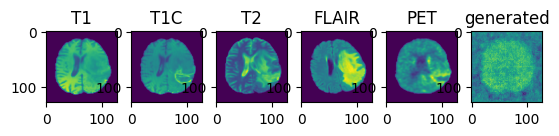

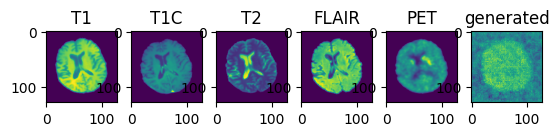

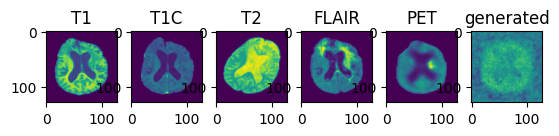

validation avg MS-SSIM: 0.2948
----------
epoch 81/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:49, 69.98s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:06, 30.60s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.85s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:27,  5.57s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:19,  4.76s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:12,  4.19s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.82s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:40<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  8.72s/it]

----------
epoch 82/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:41, 69.20s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:02, 30.28s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:40, 17.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:35, 11.97s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:01,  8.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:40,  6.78s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:28,  5.65s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:19,  4.78s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.21s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:39<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.63s/it]

----------
epoch 83/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:27, 73.37s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.18s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:49, 18.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.02s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.70s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.81s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.21s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.92s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.63s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

----------
epoch 84/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:47, 69.74s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:04, 30.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:41, 17.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:36, 12.02s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:01,  8.74s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:41,  6.90s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:28,  5.61s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:19,  4.77s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.83s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:39<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.65s/it]

----------
epoch 85/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:08<12:38, 69.00s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:10, 31.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:44, 18.24s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.21s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:02,  8.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.88s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:27,  5.60s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:19,  4.77s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.84s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:40<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  8.72s/it]

----------
epoch 86/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:31, 73.75s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:21, 32.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:50, 18.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:40, 12.62s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:29<00:42,  7.15s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:32<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:35<00:19,  4.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.28s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.01s/it]

----------
epoch 87/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:29, 73.60s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:20, 32.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:39, 12.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:41,  6.98s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.65s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.80s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.94s/it]

----------
epoch 88/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:06, 71.49s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.27s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:37, 12.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  9.00s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.93s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.61s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.78s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.20s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.75s/it]

----------
epoch 89/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:02, 71.10s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:10, 31.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:43, 18.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:37, 12.19s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:01,  8.86s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.84s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:27,  5.57s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:18,  4.74s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:40<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  8.73s/it]

----------
epoch 90/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:08<12:37, 68.88s/it]

Epoch :  17%|██████                              | 2/12 [01:11<05:00, 30.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:14<02:39, 17.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:36, 12.02s/it]

Epoch :  42%|███████████████                     | 5/12 [01:20<01:01,  8.73s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:23<00:40,  6.75s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:26<00:27,  5.49s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:29<00:18,  4.68s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:32<00:12,  4.13s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:35<00:07,  3.76s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:38<00:03,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  8.56s/it]

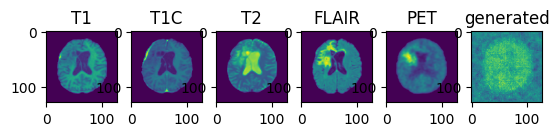

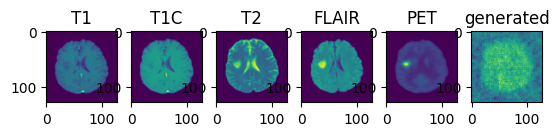

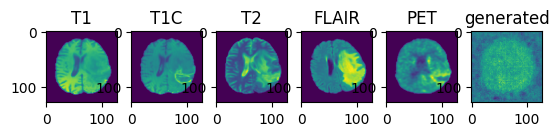

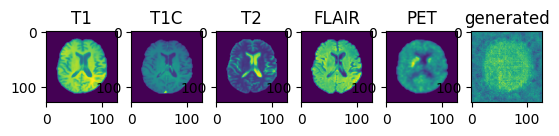

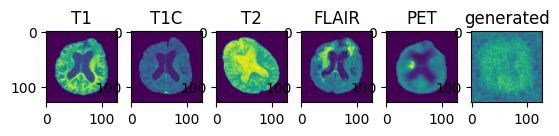

validation avg MS-SSIM: 0.3046
----------
epoch 91/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:24, 73.10s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:19, 31.93s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:48, 18.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:42, 12.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:25<01:04,  9.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.11s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.75s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.86s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.26s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  3.29s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:48<00:00,  9.05s/it]

----------
epoch 92/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:09, 71.81s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.98s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.93s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.79s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.89s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.83s/it]

----------
epoch 93/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:05, 71.40s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:46, 18.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.93s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.88s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.60s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.76s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.19s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.81s/it]

----------
epoch 94/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:23, 73.01s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:47, 18.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:39, 12.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:28<00:42,  7.03s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:31<00:28,  5.72s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  8.92s/it]

----------
epoch 95/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:05, 71.43s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.38s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.37s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.91s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.87s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:27,  5.58s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:18,  4.72s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.17s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.58s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.77s/it]

----------
epoch 96/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:43, 69.37s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:02, 30.30s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:40, 17.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:35, 11.94s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:00,  8.70s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:41,  6.87s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:27,  5.58s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:18,  4.74s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.16s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:39<00:03,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.60s/it]

----------
epoch 97/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:15<13:51, 75.63s/it]

Epoch :  17%|██████                              | 2/12 [01:18<05:29, 32.92s/it]

Epoch :  25%|█████████                           | 3/12 [01:21<02:53, 19.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:24<01:43, 12.88s/it]

Epoch :  42%|███████████████                     | 5/12 [01:27<01:05,  9.29s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:30<00:42,  7.13s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:33<00:28,  5.76s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:36<00:19,  4.88s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:39<00:12,  4.32s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:42<00:07,  3.93s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:45<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:47<00:00,  3.07s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:49<00:00,  9.15s/it]

----------
epoch 98/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:20, 72.75s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.68s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.58s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:42,  7.05s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.71s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.84s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.25s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.90s/it]

----------
epoch 99/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:58, 70.77s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.92s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:19<01:37, 12.16s/it]

Epoch :  42%|███████████████                     | 5/12 [01:22<01:01,  8.84s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:25<00:41,  6.83s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:28<00:27,  5.56s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:31<00:18,  4.72s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:34<00:12,  4.27s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:37<00:07,  3.86s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:40<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  8.74s/it]

----------
epoch 100/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:08<12:36, 68.81s/it]

Epoch :  17%|██████                              | 2/12 [01:11<05:01, 30.14s/it]

Epoch :  25%|█████████                           | 3/12 [01:14<02:39, 17.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:36, 12.04s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:01,  8.75s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:40,  6.78s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:27,  5.54s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:18,  4.74s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.81s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:38<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.63s/it]

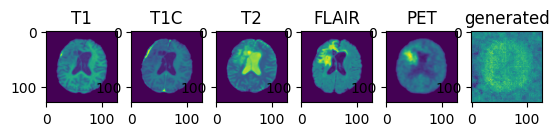

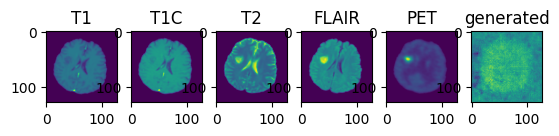

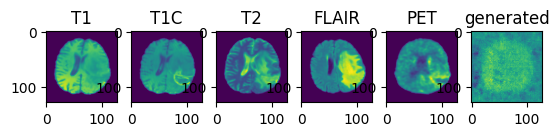

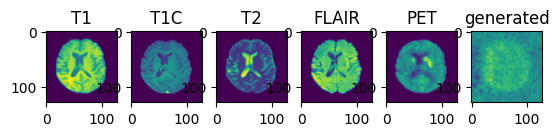

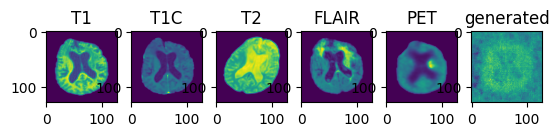

validation avg MS-SSIM: 0.2810
----------
epoch 101/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:12<13:18, 72.58s/it]

Epoch :  17%|██████                              | 2/12 [01:15<05:16, 31.62s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:46, 18.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:41,  6.96s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.68s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.87s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.90s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.15s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.91s/it]

----------
epoch 102/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:13<13:24, 73.18s/it]

Epoch :  17%|██████                              | 2/12 [01:16<05:18, 31.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:19<02:47, 18.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:22<01:39, 12.46s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:41,  6.96s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.64s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:34<00:19,  4.91s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:37<00:12,  4.30s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:40<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:43<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.91s/it]

----------
epoch 103/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:10<12:58, 70.78s/it]

Epoch :  17%|██████                              | 2/12 [01:13<05:09, 30.91s/it]

Epoch :  25%|█████████                           | 3/12 [01:16<02:43, 18.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.99s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.94s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.64s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.80s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.23s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.84s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.10s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.78s/it]

----------
epoch 104/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:06, 71.47s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.20s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.31s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.95s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.93s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.64s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:13,  4.33s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.62s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.85s/it]

----------
epoch 105/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:11, 71.96s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:13, 31.36s/it]

Epoch :  25%|█████████                           | 3/12 [01:18<02:47, 18.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:21<01:39, 12.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:24<01:03,  9.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:27<00:41,  6.95s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:30<00:28,  5.63s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:33<00:19,  4.78s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:36<00:12,  4.24s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:39<00:07,  3.82s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:42<00:03,  3.66s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:44<00:00,  3.09s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:46<00:00,  8.88s/it]

----------
epoch 106/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:05, 71.43s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:37, 12.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.89s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.85s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.69s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.84s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.25s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.88s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.60s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.79s/it]

----------
epoch 107/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:02, 71.13s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:10, 31.07s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:45, 18.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.94s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.93s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.62s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.77s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.20s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.81s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.65s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.11s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.82s/it]

----------
epoch 108/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:04, 71.30s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.28s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:38, 12.26s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:02,  8.92s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:42,  7.03s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.70s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.82s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.83s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.78s/it]

----------
epoch 109/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:42, 69.27s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:05, 30.53s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:41, 17.94s/it]

Epoch :  33%|████████████                        | 4/12 [01:18<01:36, 12.03s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:01,  8.77s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:40,  6.79s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:27,  5.55s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:19,  4.76s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.18s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.89s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:39<00:03,  3.59s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  3.02s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.63s/it]

----------
epoch 110/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:11<13:05, 71.36s/it]

Epoch :  17%|██████                              | 2/12 [01:14<05:11, 31.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:17<02:44, 18.27s/it]

Epoch :  33%|████████████                        | 4/12 [01:20<01:37, 12.23s/it]

Epoch :  42%|███████████████                     | 5/12 [01:23<01:03,  9.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:26<00:41,  6.97s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:29<00:28,  5.66s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:32<00:19,  4.80s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:35<00:12,  4.22s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:38<00:07,  3.83s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:41<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:45<00:00,  8.76s/it]

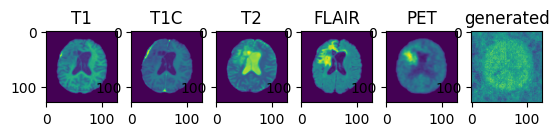

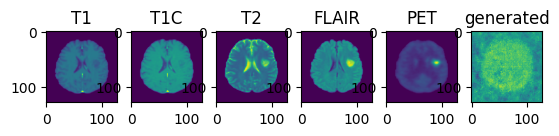

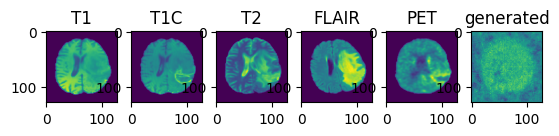

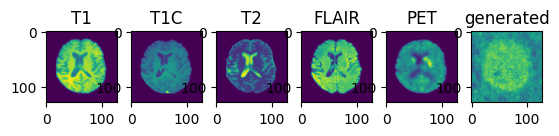

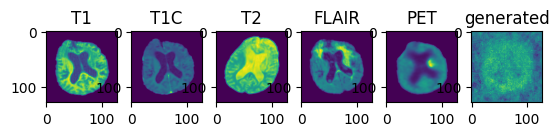

validation avg MS-SSIM: 0.2868
----------
epoch 111/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:45, 64.18s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.15s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.19s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.10s/it]

----------
epoch 112/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:28, 62.59s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.26s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:27, 10.97s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.93s/it]

----------
epoch 113/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:28, 62.62s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.49s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.24s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.10s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.35s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.98s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.97s/it]

----------
epoch 114/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:30, 62.76s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:35, 27.55s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.27s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.01s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.30s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.95s/it]

----------
epoch 115/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:34, 63.09s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:36, 27.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.51s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.13s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:57,  8.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.23s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.48s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.98s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.02s/it]

----------
epoch 116/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:51, 64.64s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:43, 28.34s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.27s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.37s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.57s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.13s/it]

----------
epoch 117/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:31, 62.89s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:35, 27.58s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:28, 16.44s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.08s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:25,  5.19s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.45s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.62s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  8.00s/it]

----------
epoch 118/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:05, 65.94s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:48, 28.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.02s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.45s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.37s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:27,  5.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.60s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.26s/it]

----------
epoch 119/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:36, 63.29s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:39, 27.95s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.49s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:28, 11.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.03s/it]

----------
epoch 120/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:51, 64.69s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:43, 28.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.12s/it]

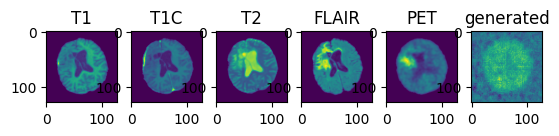

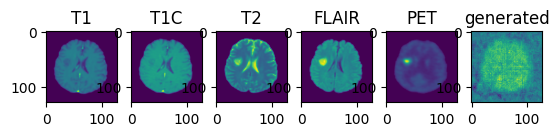

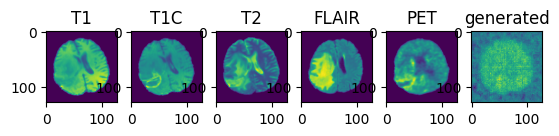

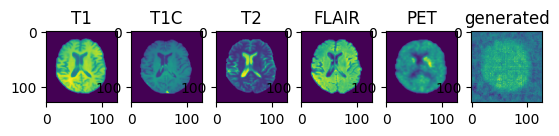

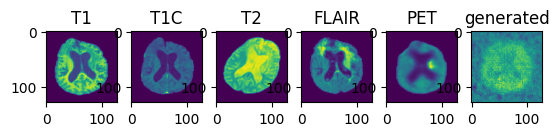

validation avg MS-SSIM: 0.3190
----------
epoch 121/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:57, 65.23s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:45, 28.57s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:31, 16.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:59,  8.45s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.56s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.36s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.20s/it]

----------
epoch 122/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:43, 64.00s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.08s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:30, 11.26s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.24s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.81s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.14s/it]

----------
epoch 123/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:32, 62.93s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:36, 27.62s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.32s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.02s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:58,  8.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.03s/it]

----------
epoch 124/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:55, 65.00s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:44, 28.47s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:31, 16.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.30s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.26s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:17,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.15s/it]

----------
epoch 125/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:52, 64.73s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:43, 28.37s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.18s/it]

----------
epoch 126/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:50, 64.59s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:43, 28.31s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.62s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.13s/it]

----------
epoch 127/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:55, 65.06s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:45, 28.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.01s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.36s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.32s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.19s/it]

----------
epoch 128/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:26, 62.43s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:25, 16.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:27, 10.96s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.94s/it]

----------
epoch 129/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:06, 66.04s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:50, 29.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:12<02:34, 17.12s/it]

Epoch :  33%|████████████                        | 4/12 [01:15<01:31, 11.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.39s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.32s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.26s/it]

----------
epoch 130/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:46, 64.21s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:39,  6.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.32s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.09s/it]

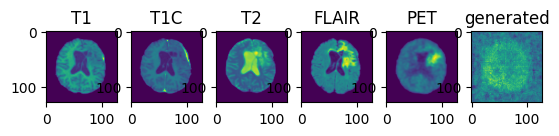

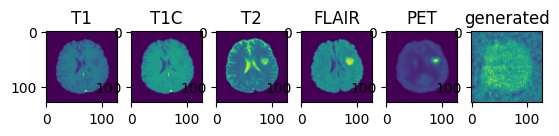

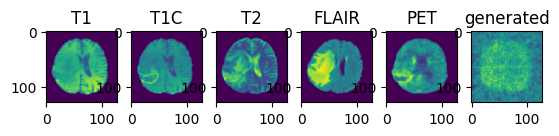

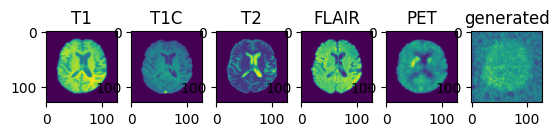

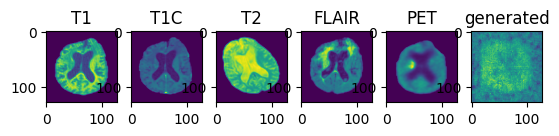

validation avg MS-SSIM: 0.2858
----------
epoch 131/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:43, 63.95s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.19s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:39,  6.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.35s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.57s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.07s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.13s/it]

----------
epoch 132/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:02, 65.68s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:59, 29.91s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:38, 17.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:35, 11.89s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<01:00,  8.68s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:40,  6.73s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:25<00:27,  5.50s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:28<00:18,  4.70s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:31<00:12,  4.15s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:34<00:07,  3.91s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:38<00:03,  3.70s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  3.12s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  8.51s/it]

----------
epoch 133/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:27, 67.97s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:57, 29.75s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:37, 17.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:17<01:34, 11.82s/it]

Epoch :  42%|███████████████                     | 5/12 [01:20<01:01,  8.83s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:23<00:41,  6.85s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:26<00:27,  5.60s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:29<00:19,  4.77s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:32<00:12,  4.21s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:35<00:07,  3.82s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:38<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  8.56s/it]

----------
epoch 134/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:26, 67.88s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:57, 29.77s/it]

Epoch :  25%|█████████                           | 3/12 [01:14<02:38, 17.56s/it]

Epoch :  33%|████████████                        | 4/12 [01:17<01:34, 11.83s/it]

Epoch :  42%|███████████████                     | 5/12 [01:20<01:00,  8.67s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:23<00:40,  6.74s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:26<00:27,  5.50s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:29<00:18,  4.70s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:32<00:12,  4.29s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:35<00:07,  3.87s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:38<00:03,  3.61s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  3.08s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  8.56s/it]

----------
epoch 135/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:09<12:40, 69.11s/it]

Epoch :  17%|██████                              | 2/12 [01:12<05:02, 30.22s/it]

Epoch :  25%|█████████                           | 3/12 [01:15<02:39, 17.76s/it]

Epoch :  33%|████████████                        | 4/12 [01:17<01:35, 11.89s/it]

Epoch :  42%|███████████████                     | 5/12 [01:21<01:03,  9.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:24<00:41,  6.96s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:27<00:28,  5.67s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:30<00:19,  4.79s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:33<00:12,  4.20s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:36<00:07,  3.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:39<00:03,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:43<00:00,  8.63s/it]

----------
epoch 136/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:20, 67.36s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:54, 29.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:36, 17.35s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:33, 11.65s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<00:59,  8.51s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:39,  6.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:27,  5.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.62s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:31<00:12,  4.20s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:34<00:07,  3.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  8.43s/it]

----------
epoch 137/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:20, 67.36s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:54, 29.45s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:36, 17.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:33, 11.64s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<01:00,  8.62s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:40,  6.67s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:25<00:27,  5.44s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:28<00:18,  4.64s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:30<00:12,  4.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  8.41s/it]

----------
epoch 138/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.43s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.12s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.15s/it]

----------
epoch 139/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:33, 63.09s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.07s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.04s/it]

----------
epoch 140/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.36s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.22s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.28s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.85s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.57s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.17s/it]

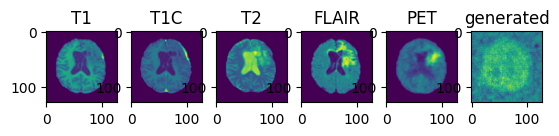

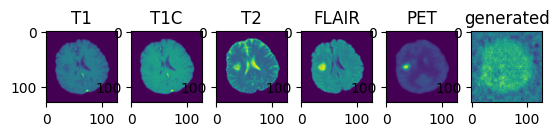

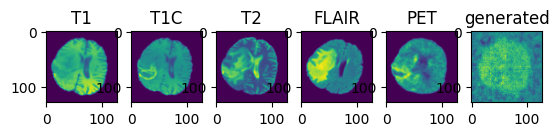

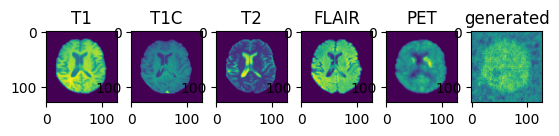

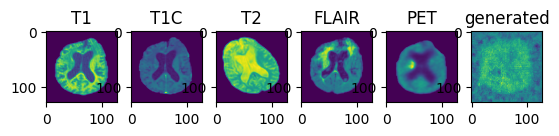

validation avg MS-SSIM: 0.2968
----------
epoch 141/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:52, 64.74s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:43, 28.39s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:31, 16.78s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.34s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.18s/it]

----------
epoch 142/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:51, 64.71s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:44, 28.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:31, 16.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.50s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.41s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.35s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.22s/it]

----------
epoch 143/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:32, 62.99s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:36, 27.68s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.10s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:57,  8.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.57s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.01s/it]

----------
epoch 144/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:22, 67.52s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:55, 29.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:36, 17.37s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:34, 11.82s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<01:00,  8.62s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:40,  6.68s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:25<00:27,  5.45s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:28<00:18,  4.65s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:31<00:12,  4.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:34<00:07,  3.73s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:37<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:41<00:00,  8.42s/it]

----------
epoch 145/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:46, 64.26s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.21s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.62s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.15s/it]

----------
epoch 146/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:26, 62.44s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.23s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:32, 11.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:59,  8.45s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:39,  6.57s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.38s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.60s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.07s/it]

----------
epoch 147/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:54, 65.00s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:45, 28.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:31, 16.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.33s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.68s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.13s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.75s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.22s/it]

----------
epoch 148/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:47, 64.29s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.19s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:31, 11.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.33s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.32s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.54s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.13s/it]

----------
epoch 149/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:44, 64.07s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.21s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.09s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.11s/it]

----------
epoch 150/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:55, 65.02s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:45, 28.51s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:31, 16.82s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.47s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.37s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.22s/it]

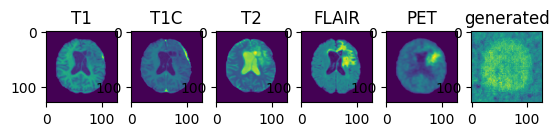

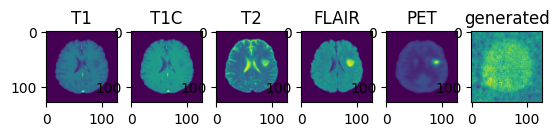

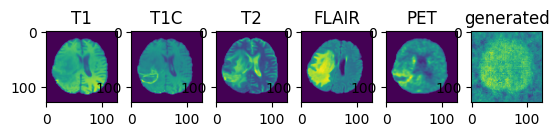

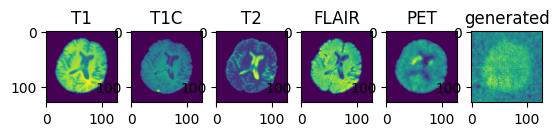

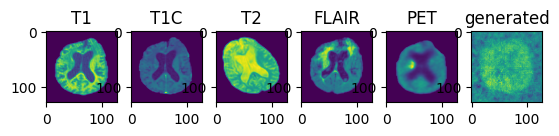

validation avg MS-SSIM: 0.2950
----------
epoch 151/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:45, 64.15s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.22s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.39s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.36s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.15s/it]

----------
epoch 152/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:00, 65.46s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:30, 11.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.66s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.12s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.23s/it]

----------
epoch 153/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:01, 65.56s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.68s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:32, 11.52s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.41s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.36s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  3.04s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.27s/it]

----------
epoch 154/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:18, 61.70s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:31, 27.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:24, 16.06s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:26, 10.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:55,  8.00s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.27s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:26,  5.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:18,  4.62s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.94s/it]

----------
epoch 155/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:49, 64.50s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.27s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:31, 11.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.36s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  3.05s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.20s/it]

----------
epoch 156/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:30, 62.74s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:35, 27.57s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.03s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.02s/it]

----------
epoch 157/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:25, 62.35s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.44s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.12s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:57,  8.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.06s/it]

----------
epoch 158/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:37, 63.44s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:38, 27.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.13s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.36s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.08s/it]

----------
epoch 159/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:18, 67.11s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:53, 29.37s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:37, 17.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:33, 11.74s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<00:59,  8.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:39,  6.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:25<00:27,  5.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:30<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  8.41s/it]

----------
epoch 160/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:45, 64.10s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.60s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.35s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.12s/it]

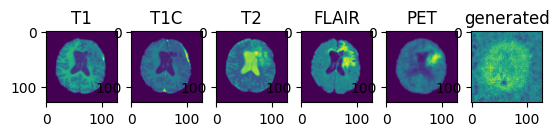

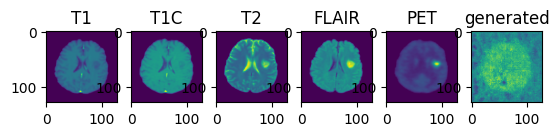

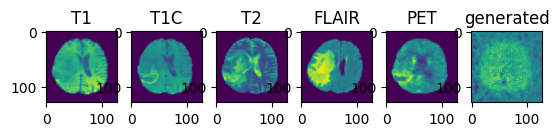

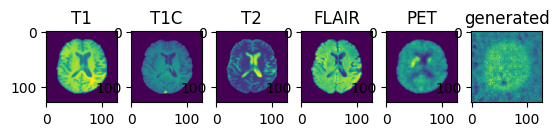

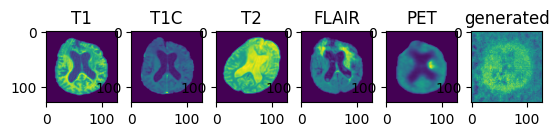

validation avg MS-SSIM: 0.2918
----------
epoch 161/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:43, 63.92s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.16s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:39,  6.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.34s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.12s/it]

----------
epoch 162/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:00, 65.52s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:49, 28.92s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.06s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.47s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.38s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.35s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.57s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.28s/it]

----------
epoch 163/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:02, 65.65s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:47, 28.77s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:27,  5.40s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.07s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.26s/it]

----------
epoch 164/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:20, 67.35s/it]

Epoch :  17%|██████                              | 2/12 [01:11<05:03, 30.39s/it]

Epoch :  25%|█████████                           | 3/12 [01:14<02:40, 17.83s/it]

Epoch :  33%|████████████                        | 4/12 [01:17<01:35, 11.93s/it]

Epoch :  42%|███████████████                     | 5/12 [01:20<01:00,  8.68s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:23<00:40,  6.72s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:26<00:27,  5.47s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:29<00:18,  4.66s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:32<00:12,  4.11s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:35<00:07,  3.82s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:38<00:03,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:42<00:00,  8.51s/it]

----------
epoch 165/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.45s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.23s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.22s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.34s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.13s/it]

----------
epoch 166/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:54, 64.96s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.36s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:11,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.17s/it]

----------
epoch 167/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:07, 66.09s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:49, 28.95s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.06s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.48s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.39s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:21<00:40,  6.77s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:27,  5.51s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.68s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:30<00:12,  4.11s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.30s/it]

----------
epoch 168/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:02, 65.68s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:47, 28.73s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:30, 11.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:38,  6.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.21s/it]

----------
epoch 169/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:12, 66.60s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:51, 29.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:12<02:34, 17.13s/it]

Epoch :  33%|████████████                        | 4/12 [01:15<01:32, 11.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:18<00:59,  8.53s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:21<00:39,  6.61s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:26,  5.40s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.60s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:30<00:12,  4.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.30s/it]

----------
epoch 170/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:49, 64.50s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.74s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.28s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.07s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.13s/it]

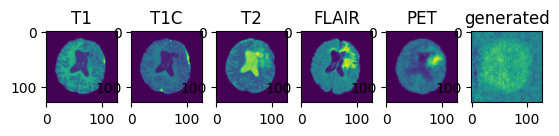

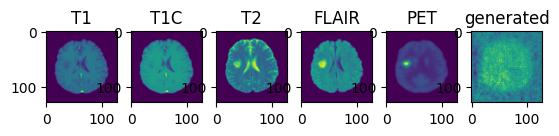

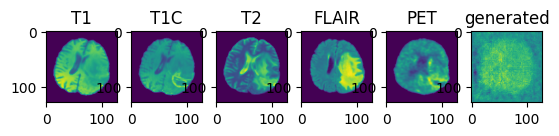

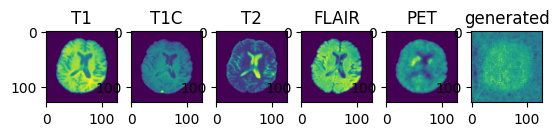

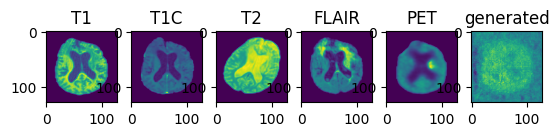

validation avg MS-SSIM: 0.2931
----------
epoch 171/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:58, 65.32s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:48, 28.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.33s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:38,  6.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.75s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.19s/it]

----------
epoch 172/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:06, 66.02s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:48, 28.88s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.03s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.44s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.61s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.39s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.59s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.29s/it]

----------
epoch 173/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:12, 66.59s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:53, 29.33s/it]

Epoch :  25%|█████████                           | 3/12 [01:12<02:35, 17.24s/it]

Epoch :  33%|████████████                        | 4/12 [01:15<01:32, 11.57s/it]

Epoch :  42%|███████████████                     | 5/12 [01:18<00:59,  8.43s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:21<00:39,  6.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:26,  5.34s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.77s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.29s/it]

----------
epoch 174/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.42s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.24s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.23s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.34s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.11s/it]

----------
epoch 175/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:57, 65.27s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:55, 29.53s/it]

Epoch :  25%|█████████                           | 3/12 [01:12<02:36, 17.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:15<01:33, 11.69s/it]

Epoch :  42%|███████████████                     | 5/12 [01:18<00:59,  8.54s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:21<00:39,  6.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:27,  5.42s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.64s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:30<00:12,  4.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.84s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.56s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  8.35s/it]

----------
epoch 176/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:05, 65.94s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:48, 28.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.39s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.59s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.26s/it]

----------
epoch 177/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:43, 63.98s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:41, 28.11s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.59s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.17s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.17s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.23s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.08s/it]

----------
epoch 178/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:35, 63.19s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.72s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.38s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.05s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.09s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.00s/it]

----------
epoch 179/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:06, 66.06s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:51, 29.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:12<02:34, 17.15s/it]

Epoch :  33%|████████████                        | 4/12 [01:15<01:32, 11.51s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.40s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.54s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.26s/it]

----------
epoch 180/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:43, 63.94s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.14s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.05s/it]

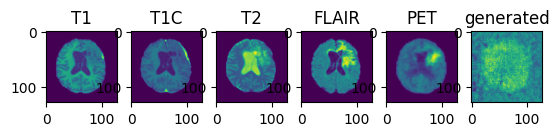

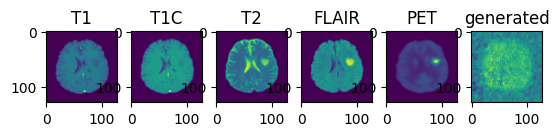

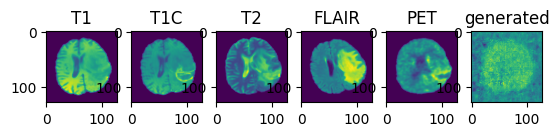

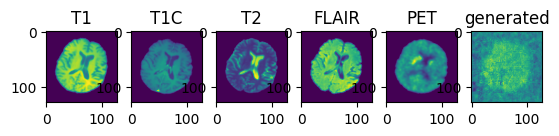

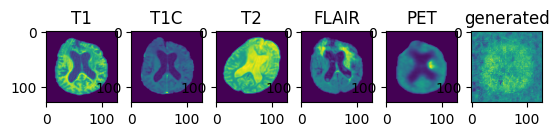

validation avg MS-SSIM: 0.2775
----------
epoch 181/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.37s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.20s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.21s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.36s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.57s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.11s/it]

----------
epoch 182/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:43, 63.97s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.72s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:30, 11.26s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.08s/it]

----------
epoch 183/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:31, 62.87s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:36, 27.62s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.32s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.01s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.08s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.31s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.96s/it]

----------
epoch 184/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:00, 65.51s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:48, 28.88s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.01s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:38,  6.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.24s/it]

----------
epoch 185/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.37s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.19s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.62s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:11,  3.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.06s/it]

----------
epoch 186/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:38, 63.46s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.04s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.15s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.06s/it]

----------
epoch 187/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.42s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.21s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.32s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.54s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.10s/it]

----------
epoch 188/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:54, 64.99s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:11,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.17s/it]

----------
epoch 189/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:35, 63.26s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.73s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:27, 16.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.07s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.99s/it]

----------
epoch 190/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:30, 62.78s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.77s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.07s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.98s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.02s/it]

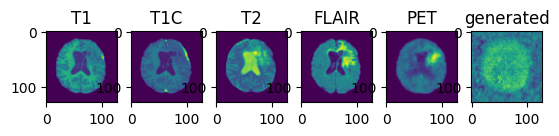

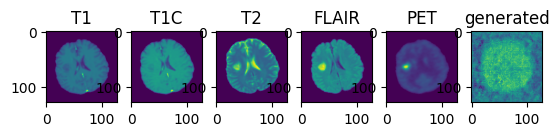

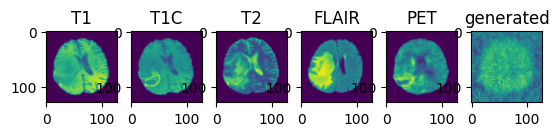

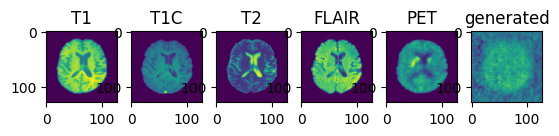

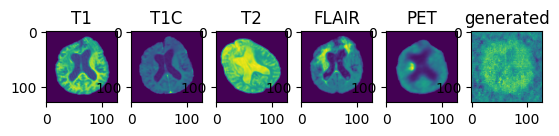

validation avg MS-SSIM: 0.3097
----------
epoch 191/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:38, 63.49s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:38, 27.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:17,  4.49s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.06s/it]

----------
epoch 192/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:34, 63.15s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.08s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.01s/it]

----------
epoch 193/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:36, 63.32s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.76s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.14s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.35s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.21s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.62s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.03s/it]

----------
epoch 194/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.41s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.22s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.66s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.23s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.37s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.57s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.12s/it]

----------
epoch 195/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:09, 66.36s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:50, 29.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:12<02:35, 17.25s/it]

Epoch :  33%|████████████                        | 4/12 [01:15<01:32, 11.58s/it]

Epoch :  42%|███████████████                     | 5/12 [01:18<00:59,  8.44s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:21<00:39,  6.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.35s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.28s/it]

----------
epoch 196/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:56, 65.15s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:45, 28.54s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:31, 16.86s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:27,  5.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.07s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.18s/it]

----------
epoch 197/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:40, 63.68s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:39, 27.92s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.21s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.21s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.40s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:17,  4.48s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.05s/it]

----------
epoch 198/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:58, 65.35s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:45, 28.60s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:31, 16.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.33s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.28s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.38s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.17s/it]

----------
epoch 199/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.42s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:44, 28.44s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.30s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.28s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.14s/it]

----------
epoch 200/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:44, 64.03s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.08s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.58s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.17s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.36s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.07s/it]

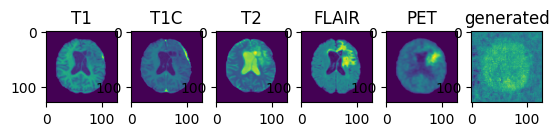

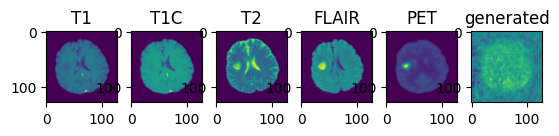

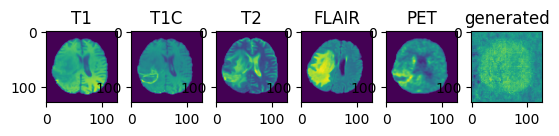

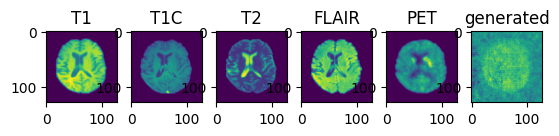

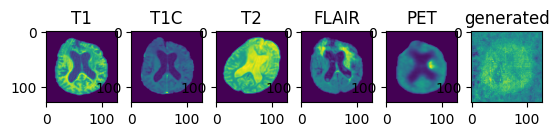

validation avg MS-SSIM: 0.2925
----------
epoch 201/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:39, 63.55s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:38, 27.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:28, 11.09s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:56,  8.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.04s/it]

----------
epoch 202/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:47, 64.35s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.20s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.12s/it]

----------
epoch 203/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:49, 64.47s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.65s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.21s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.23s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.60s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.11s/it]

----------
epoch 204/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.42s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.20s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.64s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.11s/it]

----------
epoch 205/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:47, 64.36s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.19s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:29, 16.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.20s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.59s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.09s/it]

----------
epoch 206/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:47, 64.36s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.20s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:31, 16.81s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.31s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.27s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.14s/it]

----------
epoch 207/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:30, 62.80s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:35, 27.56s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.31s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.02s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.11s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.99s/it]

----------
epoch 208/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:45, 64.15s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.61s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:34, 11.82s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<01:00,  8.61s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:40,  6.67s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:27,  5.44s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.63s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.09s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  3.03s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.22s/it]

----------
epoch 209/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:00, 65.49s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:31, 16.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:30, 11.35s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.30s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:19,  4.75s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.17s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.80s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.28s/it]

----------
epoch 210/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:32, 62.95s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:36, 27.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.50s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.12s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:57,  8.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.35s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.03s/it]

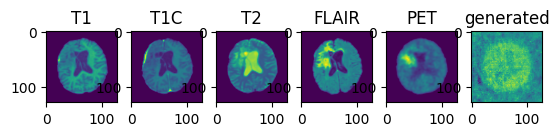

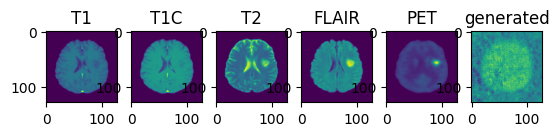

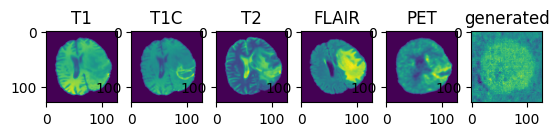

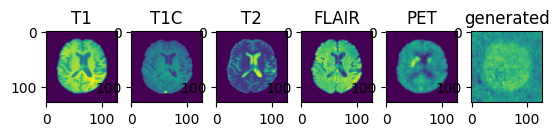

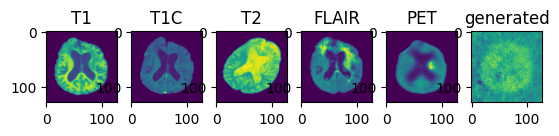

validation avg MS-SSIM: 0.2914
----------
epoch 211/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:38, 63.49s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:38, 27.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:28, 11.10s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.49s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.02s/it]

----------
epoch 212/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:24, 62.23s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:33, 27.34s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:25, 16.18s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.94s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.03s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:18,  4.54s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.94s/it]

----------
epoch 213/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:43, 63.91s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:11,  3.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.14s/it]

----------
epoch 214/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:01, 65.58s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.91s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:38,  6.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:27,  5.42s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.60s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.21s/it]

----------
epoch 215/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:35, 63.24s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.73s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.15s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.21s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.02s/it]

----------
epoch 216/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:35, 63.18s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.38s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.06s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.38s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.59s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.04s/it]

----------
epoch 217/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:27, 62.46s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.45s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.05s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:25,  5.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.45s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.98s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.98s/it]

----------
epoch 218/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:22, 62.04s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:32, 27.23s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:24, 16.10s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.88s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:55,  7.99s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.25s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.92s/it]

----------
epoch 219/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:34, 63.14s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.71s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.37s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.37s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.06s/it]

----------
epoch 220/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:23, 62.14s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:33, 27.30s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:25, 16.15s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.90s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.00s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.26s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.15s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.94s/it]

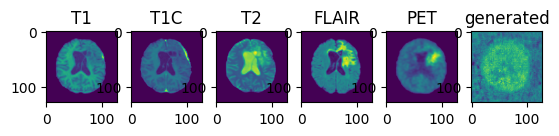

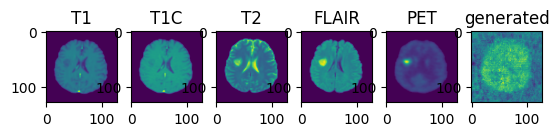

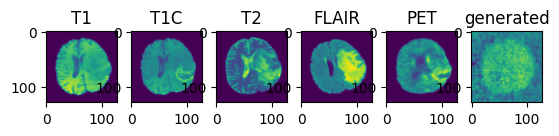

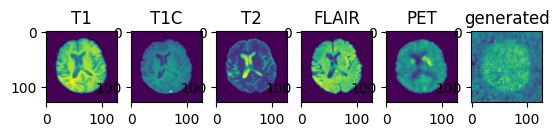

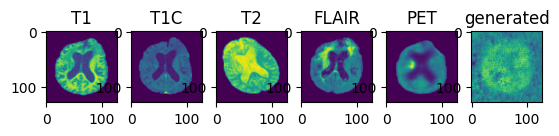

validation avg MS-SSIM: 0.3105
----------
epoch 221/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:31, 62.90s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:36, 27.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.03s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:25,  5.19s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  8.00s/it]

----------
epoch 222/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:41, 63.78s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:39, 27.96s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.53s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.14s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.28s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.07s/it]

----------
epoch 223/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:38, 63.52s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:38, 27.86s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.45s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:28, 11.09s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:56,  8.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:25,  5.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.05s/it]

----------
epoch 224/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:26, 62.43s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.41s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.23s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:27, 10.98s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.33s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:26,  5.21s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.98s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.95s/it]

----------
epoch 225/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:44, 64.05s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.58s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.17s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.25s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:11,  3.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.75s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.11s/it]

----------
epoch 226/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:04, 60.43s/it]

Epoch :  17%|██████                              | 2/12 [01:03<04:27, 26.77s/it]

Epoch :  25%|█████████                           | 3/12 [01:06<02:22, 15.88s/it]

Epoch :  33%|████████████                        | 4/12 [01:09<01:26, 10.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:12<00:55,  7.93s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:38,  6.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:18<00:26,  5.21s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:21<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:24<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  2.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  7.80s/it]

----------
epoch 227/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:09, 60.89s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:31, 27.13s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:24, 16.10s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.91s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.26s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:18<00:25,  5.15s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:21<00:17,  4.42s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:24<00:11,  3.94s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.62s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.64s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  3.06s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.92s/it]

----------
epoch 228/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:43, 63.98s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.06s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.57s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.17s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:39,  6.52s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.06s/it]

----------
epoch 229/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:00<11:09, 60.90s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:30, 27.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:24, 16.03s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:26, 10.84s/it]

Epoch :  42%|███████████████                     | 5/12 [01:12<00:55,  7.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:37,  6.24s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:18<00:25,  5.15s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:21<00:17,  4.43s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:24<00:11,  3.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.62s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.87s/it]

----------
epoch 230/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:17, 61.55s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:30, 27.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:24, 16.01s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:26, 10.83s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:55,  7.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:37,  6.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:18,  4.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.89s/it]

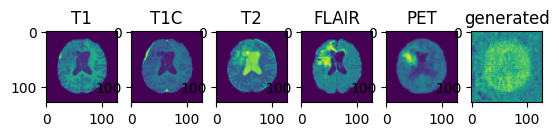

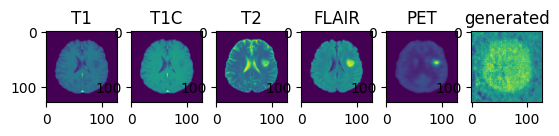

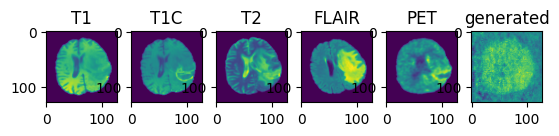

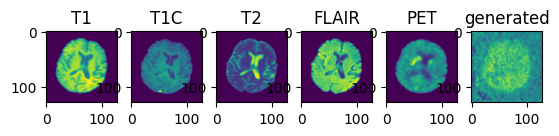

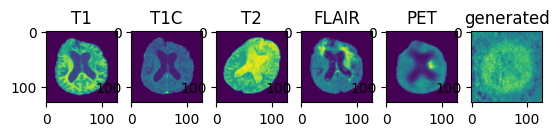

validation avg MS-SSIM: 0.3045
----------
epoch 231/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:27, 67.92s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:56, 29.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:36, 17.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:33, 11.68s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<00:59,  8.50s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:39,  6.59s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:25<00:26,  5.38s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:28<00:18,  4.59s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:30<00:12,  4.07s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  8.38s/it]

----------
epoch 232/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:20, 61.90s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:31, 27.20s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.26s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.97s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.05s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.44s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.62s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.39s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.92s/it]

----------
epoch 233/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:30, 62.81s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:35, 27.57s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.31s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.00s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.96s/it]

----------
epoch 234/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:30, 62.81s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:35, 27.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.35s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:29, 11.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:57,  8.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.23s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.48s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.98s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.02s/it]

----------
epoch 235/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:42, 63.88s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:39, 27.99s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.51s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:28, 11.12s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.35s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.54s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.04s/it]

----------
epoch 236/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:21, 61.92s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:31, 27.18s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.25s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.97s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.29s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.17s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.44s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.94s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.61s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.38s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.93s/it]

----------
epoch 237/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:23, 67.56s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:55, 29.53s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:36, 17.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:33, 11.66s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<00:59,  8.49s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:39,  6.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:26,  5.38s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:28<00:18,  4.70s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:31<00:12,  4.13s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  8.42s/it]

----------
epoch 238/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:33, 63.03s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:36, 27.64s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:29, 11.15s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:57,  8.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.01s/it]

----------
epoch 239/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:32, 62.92s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:35, 27.59s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.29s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:27, 10.99s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:25,  5.17s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.39s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.86s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.98s/it]

----------
epoch 240/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:26, 62.44s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:25, 16.22s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.10s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:57,  8.14s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.48s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.98s/it]

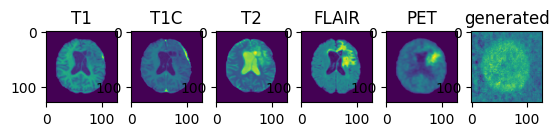

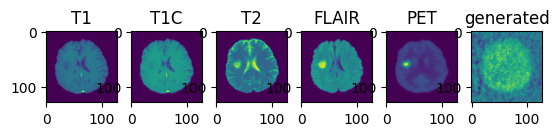

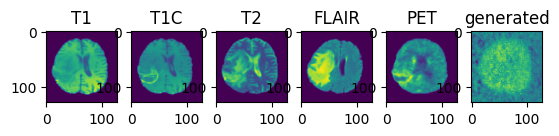

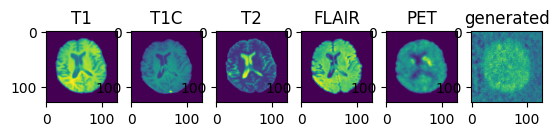

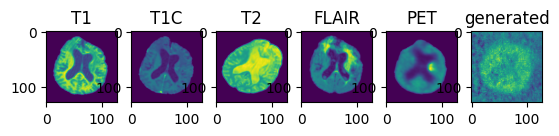

validation avg MS-SSIM: 0.3096
----------
epoch 241/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:38, 63.47s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:38, 27.82s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:27, 16.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:28, 11.06s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.05s/it]

----------
epoch 242/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:28, 62.60s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.47s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.23s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:27, 10.96s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.04s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.17s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.43s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.97s/it]

----------
epoch 243/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:25, 62.33s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:34, 27.40s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:25, 16.20s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:27, 10.95s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:57,  8.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.25s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.95s/it]

----------
epoch 244/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:43, 63.97s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.06s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.57s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.18s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.25s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:17,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.11s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.09s/it]

----------
epoch 245/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:51, 64.72s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:43, 28.34s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.73s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.28s/it]

Epoch :  42%|███████████████                     | 5/12 [01:18<01:02,  8.89s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:41,  6.86s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:27,  5.57s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.73s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.17s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.27s/it]

----------
epoch 246/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:35, 63.24s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.77s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:27, 16.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.07s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.12s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.34s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.99s/it]

----------
epoch 247/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:42, 63.86s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.01s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:30, 11.30s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.28s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.51s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:11,  3.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.06s/it]

----------
epoch 248/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:24, 62.21s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:33, 27.31s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:25, 16.16s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.91s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.26s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.44s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.92s/it]

----------
epoch 249/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:25, 67.75s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:56, 29.61s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:36, 17.42s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:33, 11.70s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<01:00,  8.65s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:40,  6.69s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:25<00:27,  5.45s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:28<00:18,  4.63s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:31<00:12,  4.09s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:34<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:37<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  8.41s/it]

----------
epoch 250/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:42, 63.84s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:39, 28.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.14s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.21s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.05s/it]

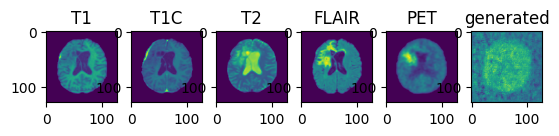

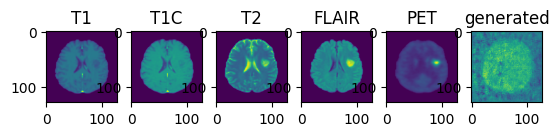

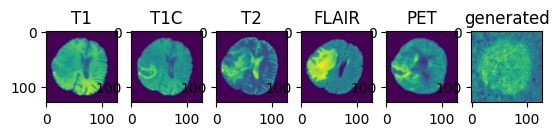

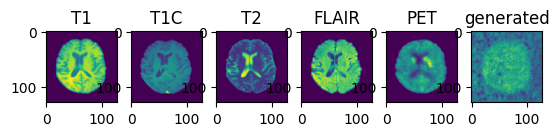

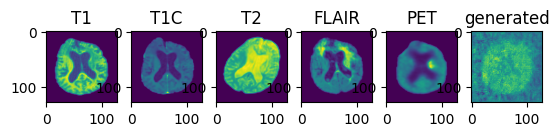

validation avg MS-SSIM: 0.3039
----------
epoch 251/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:16, 61.47s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:32, 27.27s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:25, 16.16s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.92s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.02s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.28s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.16s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.44s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.95s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.90s/it]

----------
epoch 252/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:33, 63.07s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:36, 27.68s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:27, 16.35s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.03s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.09s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.99s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.98s/it]

----------
epoch 253/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:48, 64.41s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:44, 28.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.30s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.25s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.14s/it]

----------
epoch 254/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:22, 62.01s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:32, 27.25s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:25, 16.13s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.91s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:56,  8.01s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:38,  6.39s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:26,  5.24s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.49s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.98s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.95s/it]

----------
epoch 255/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:24, 62.26s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:33, 27.31s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.01s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.07s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.30s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.18s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.44s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.94s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.61s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.49s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.98s/it]

----------
epoch 256/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:36, 63.31s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:37, 27.78s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:27, 16.40s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.07s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.13s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:38,  6.35s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.35s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.01s/it]

----------
epoch 257/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:34, 63.12s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.02s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.54s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.14s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.16s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.22s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.04s/it]

----------
epoch 258/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:16, 61.53s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:30, 27.05s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:24, 16.03s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:26, 10.84s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:55,  7.97s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:37,  6.23s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:26,  5.25s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.49s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:24<00:11,  3.98s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.86s/it]

----------
epoch 259/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:39, 63.58s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:38, 27.87s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.63s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.19s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.19s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.38s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.23s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:17,  4.48s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:11,  3.97s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.39s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.08s/it]

----------
epoch 260/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:19, 61.81s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:31, 27.16s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:24, 16.08s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:26, 10.87s/it]

Epoch :  42%|███████████████                     | 5/12 [01:13<00:55,  7.98s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:37,  6.24s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:25,  5.14s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:12,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.64s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.91s/it]

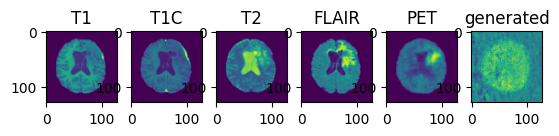

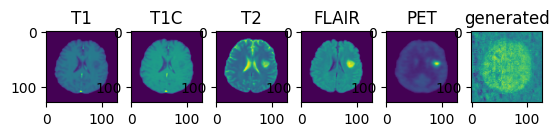

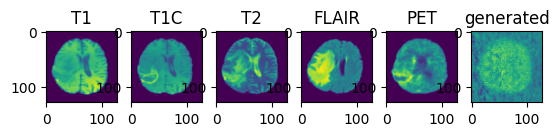

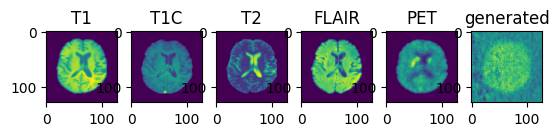

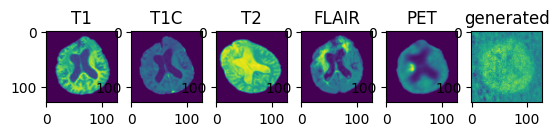

validation avg MS-SSIM: 0.2984
----------
epoch 261/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:13, 61.27s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:29, 26.95s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:23, 15.96s/it]

Epoch :  33%|████████████                        | 4/12 [01:09<01:26, 10.78s/it]

Epoch :  42%|███████████████                     | 5/12 [01:12<00:55,  7.93s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:15<00:37,  6.20s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:18<00:25,  5.11s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:21<00:17,  4.39s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:24<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:27<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:30<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:31<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  7.85s/it]

----------
epoch 262/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:02<11:23, 62.12s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:32, 27.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:25, 16.14s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:27, 10.91s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:57,  8.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:16<00:38,  6.35s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:19<00:26,  5.21s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:22<00:17,  4.46s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:25<00:11,  3.96s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:28<00:07,  3.63s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:31<00:03,  3.40s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:32<00:00,  2.87s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.92s/it]

----------
epoch 263/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:33, 63.02s/it]

Epoch :  17%|██████                              | 2/12 [01:05<04:36, 27.66s/it]

Epoch :  25%|█████████                           | 3/12 [01:08<02:26, 16.33s/it]

Epoch :  33%|████████████                        | 4/12 [01:11<01:28, 11.02s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:56,  8.10s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:37,  6.32s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.20s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:17,  4.47s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.99s/it]

----------
epoch 264/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:41, 63.77s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:39, 27.97s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.52s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.15s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:58,  8.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.88s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.06s/it]

----------
epoch 265/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:38, 63.47s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:38, 27.87s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:28, 11.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.15s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.36s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:26,  5.25s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.73s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.06s/it]

----------
epoch 266/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:49, 64.54s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.29s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.38s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.15s/it]

----------
epoch 267/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:59, 65.45s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.17s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.78s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.22s/it]

----------
epoch 268/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:01<11:17, 61.55s/it]

Epoch :  17%|██████                              | 2/12 [01:04<04:30, 27.09s/it]

Epoch :  25%|█████████                           | 3/12 [01:07<02:24, 16.05s/it]

Epoch :  33%|████████████                        | 4/12 [01:10<01:26, 10.86s/it]

Epoch :  42%|███████████████                     | 5/12 [01:14<00:59,  8.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:17<00:39,  6.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:20<00:27,  5.40s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:23<00:18,  4.60s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:26<00:12,  4.07s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:33<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  7.98s/it]

----------
epoch 269/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:03, 65.73s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:47, 28.76s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.95s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.33s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:38,  6.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.54s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.77s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.22s/it]

----------
epoch 270/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:03, 65.75s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:47, 28.77s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.96s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.34s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.60s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.39s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.59s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.22s/it]

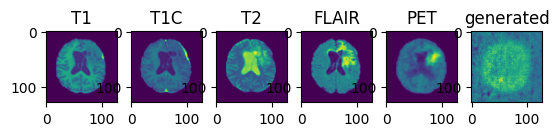

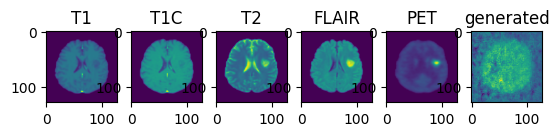

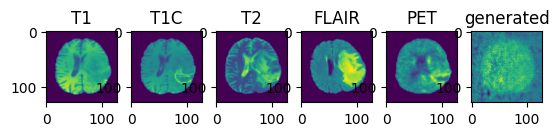

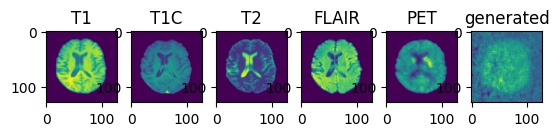

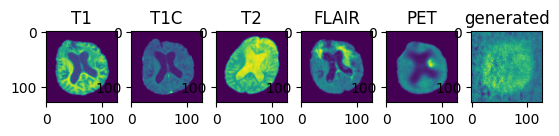

validation avg MS-SSIM: 0.3106
----------
epoch 271/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:49, 64.46s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.26s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.23s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.42s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.39s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.60s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.70s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.15s/it]

----------
epoch 272/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:16, 66.99s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:53, 29.34s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:37, 17.46s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:33, 11.71s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<00:59,  8.54s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:39,  6.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:27,  5.40s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.62s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:30<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.55s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  8.36s/it]

----------
epoch 273/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:02, 65.68s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:47, 28.76s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.95s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.40s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.33s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:38,  6.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:27,  5.42s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.62s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.21s/it]

----------
epoch 274/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:52, 64.81s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:44, 28.46s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.98s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.54s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  3.01s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.19s/it]

----------
epoch 275/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:52, 64.78s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:43, 28.37s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.75s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.33s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.28s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:27,  5.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.07s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.18s/it]

----------
epoch 276/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:56, 65.17s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:45, 28.53s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.01s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:38,  6.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.32s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  3.00s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.21s/it]

----------
epoch 277/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:59, 65.40s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.90s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:30, 11.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.30s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.65s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.73s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.19s/it]

----------
epoch 278/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:20, 67.32s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:54, 29.43s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:35, 17.31s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:34, 11.76s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<00:59,  8.56s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:39,  6.63s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:25<00:27,  5.40s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.60s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:30<00:12,  4.06s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:36<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  8.35s/it]

----------
epoch 279/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:57, 65.24s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:45, 28.57s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:31, 16.85s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.34s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.30s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.46s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.30s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.65s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.19s/it]

----------
epoch 280/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:45, 64.14s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:41, 28.12s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.70s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:31, 11.40s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.34s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.14s/it]

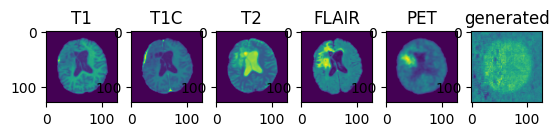

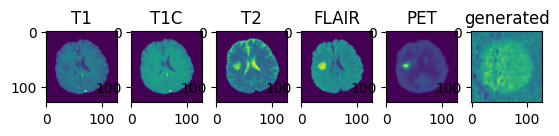

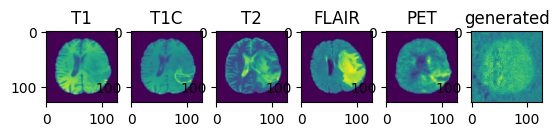

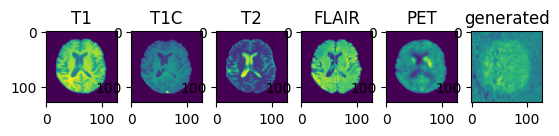

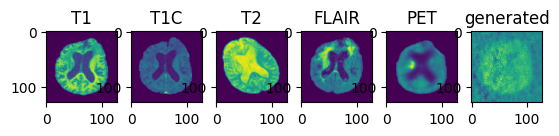

validation avg MS-SSIM: 0.3200
----------
epoch 281/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:38, 63.52s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:38, 27.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.47s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:28, 11.11s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:58,  8.29s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.45s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:29<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:32<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.07s/it]

----------
epoch 282/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:02, 65.72s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:47, 28.76s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.94s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.39s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:38,  6.48s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.29s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.12s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.73s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.22s/it]

----------
epoch 283/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:54, 64.99s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:44, 28.47s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:31, 16.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.32s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.28s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.59s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.40s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.07s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.19s/it]

----------
epoch 284/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:49, 64.46s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:44, 28.48s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:31, 16.80s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:30, 11.31s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:57,  8.27s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.77s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.15s/it]

----------
epoch 285/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:00, 65.47s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.42s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.36s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:27,  5.46s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.64s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.10s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.72s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.22s/it]

----------
epoch 286/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:00, 65.52s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.68s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:33, 17.09s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.49s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.39s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.51s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:26,  5.33s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.55s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.03s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.53s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.24s/it]

----------
epoch 287/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:00, 65.52s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.69s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.92s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.38s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.32s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:27,  5.44s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.62s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.71s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.45s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.21s/it]

----------
epoch 288/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:11, 66.50s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:50, 29.07s/it]

Epoch :  25%|█████████                           | 3/12 [01:12<02:34, 17.11s/it]

Epoch :  33%|████████████                        | 4/12 [01:15<01:33, 11.66s/it]

Epoch :  42%|███████████████                     | 5/12 [01:18<00:59,  8.49s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:21<00:39,  6.58s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:26,  5.37s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:27<00:18,  4.58s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.31s/it]

----------
epoch 289/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:42, 63.90s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.17s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.20s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.27s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.07s/it]

----------
epoch 290/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:52, 64.82s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:44, 28.42s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.77s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:32, 11.54s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.43s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:39,  6.55s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.35s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.57s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.05s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.69s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.46s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.92s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.17s/it]

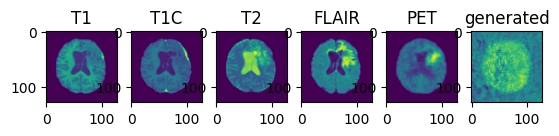

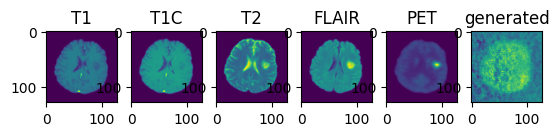

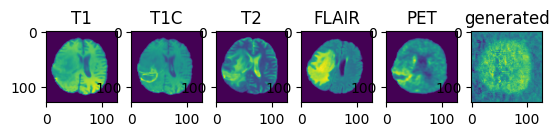

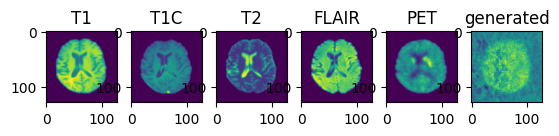

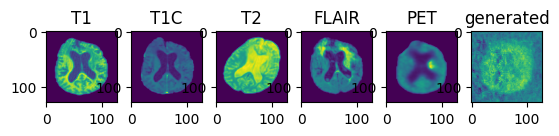

validation avg MS-SSIM: 0.3147
----------
epoch 291/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:49, 64.53s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.28s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.68s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.23s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.36s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.50s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.31s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.66s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.42s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.89s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.13s/it]

----------
epoch 292/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:07<12:23, 67.59s/it]

Epoch :  17%|██████                              | 2/12 [01:10<04:55, 29.55s/it]

Epoch :  25%|█████████                           | 3/12 [01:13<02:36, 17.39s/it]

Epoch :  33%|████████████                        | 4/12 [01:16<01:33, 11.68s/it]

Epoch :  42%|███████████████                     | 5/12 [01:19<00:59,  8.52s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:22<00:39,  6.62s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:25<00:27,  5.41s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:28<00:18,  4.61s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:31<00:12,  4.18s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:34<00:07,  3.79s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:37<00:03,  3.51s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:40<00:00,  8.41s/it]

----------
epoch 293/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:04<11:49, 64.53s/it]

Epoch :  17%|██████                              | 2/12 [01:07<04:42, 28.27s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.69s/it]

Epoch :  33%|████████████                        | 4/12 [01:13<01:29, 11.24s/it]

Epoch :  42%|███████████████                     | 5/12 [01:16<00:58,  8.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.30s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.54s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.68s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.44s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.91s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.11s/it]

----------
epoch 294/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:06<12:13, 66.69s/it]

Epoch :  17%|██████                              | 2/12 [01:09<04:51, 29.18s/it]

Epoch :  25%|█████████                           | 3/12 [01:12<02:34, 17.17s/it]

Epoch :  33%|████████████                        | 4/12 [01:15<01:32, 11.53s/it]

Epoch :  42%|███████████████                     | 5/12 [01:18<00:58,  8.42s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:21<00:39,  6.54s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:24<00:26,  5.34s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.56s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.04s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:33<00:07,  3.78s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.50s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  2.95s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:39<00:00,  8.28s/it]

----------
epoch 295/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:42, 63.87s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:40, 28.03s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:28, 16.55s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.16s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.18s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.44s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.43s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.90s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.06s/it]

----------
epoch 296/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<11:59, 65.45s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.65s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:31, 16.89s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:30, 11.37s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.31s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:19<00:38,  6.47s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:22<00:26,  5.30s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:25<00:18,  4.53s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:28<00:12,  4.02s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:31<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.52s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.96s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.18s/it]

----------
epoch 297/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:05, 65.93s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:48, 28.84s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 17.00s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.43s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.37s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:39,  6.53s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:27,  5.46s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.66s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.11s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.74s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:35<00:03,  3.48s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  2.94s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.25s/it]

----------
epoch 298/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:36, 63.30s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:38, 27.85s/it]

Epoch :  25%|█████████                           | 3/12 [01:09<02:29, 16.67s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:30, 11.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.43s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.28s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.52s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:12,  4.01s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.67s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.54s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:34<00:00,  2.97s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  8.08s/it]

----------
epoch 299/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:05<12:00, 65.49s/it]

Epoch :  17%|██████                              | 2/12 [01:08<04:46, 28.67s/it]

Epoch :  25%|█████████                           | 3/12 [01:11<02:32, 16.93s/it]

Epoch :  33%|████████████                        | 4/12 [01:14<01:31, 11.41s/it]

Epoch :  42%|███████████████                     | 5/12 [01:17<00:58,  8.35s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:20<00:38,  6.49s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:23<00:27,  5.43s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:26<00:18,  4.63s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:29<00:12,  4.08s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:32<00:07,  3.73s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:34<00:03,  3.47s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:36<00:00,  2.93s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:38<00:00,  8.21s/it]

----------
epoch 300/300


Epoch :   0%|                                            | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███                                 | 1/12 [01:03<11:41, 63.79s/it]

Epoch :  17%|██████                              | 2/12 [01:06<04:39, 28.00s/it]

Epoch :  25%|█████████                           | 3/12 [01:10<02:30, 16.71s/it]

Epoch :  33%|████████████                        | 4/12 [01:12<01:29, 11.25s/it]

Epoch :  42%|███████████████                     | 5/12 [01:15<00:57,  8.24s/it]

Epoch :  50%|██████████████████                  | 6/12 [01:18<00:38,  6.41s/it]

Epoch :  58%|█████████████████████               | 7/12 [01:21<00:26,  5.26s/it]

Epoch :  67%|████████████████████████            | 8/12 [01:24<00:18,  4.50s/it]

Epoch :  75%|███████████████████████████         | 9/12 [01:27<00:11,  4.00s/it]

Epoch :  83%|█████████████████████████████▏     | 10/12 [01:30<00:07,  3.65s/it]

Epoch :  92%|████████████████████████████████   | 11/12 [01:33<00:03,  3.41s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:35<00:00,  2.99s/it]

Epoch : 100%|███████████████████████████████████| 12/12 [01:37<00:00,  8.10s/it]

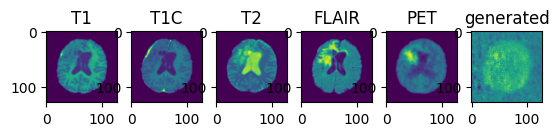

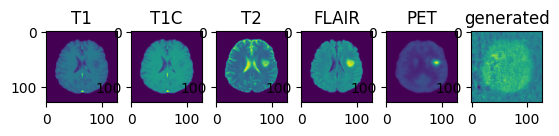

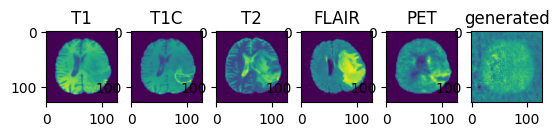

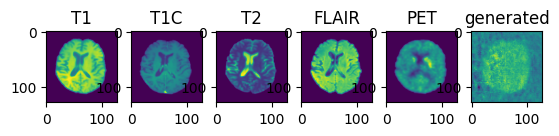

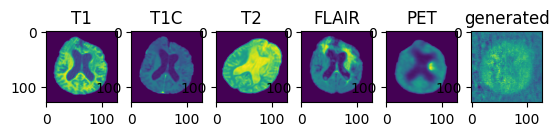

validation avg MS-SSIM: 0.3227


In [11]:
epoch_loss_values = [(0, 0)]
gen_step_loss = []
disc_step_loss = []
step = 0
max_epochs = 300
disc_train_interval = 1
disc_train_steps = 1
validation_interval = 10
best_ssim = 0
torch.cuda.empty_cache()

for epoch in range(max_epochs):
    gen_net.train()
    disc_net.train()
    epoch_loss = 0

    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")

    for batch_data in tqdm(train_loader, desc=("Epoch ")):
        input_images = torch.cat((batch_data["t1"].to(device, dtype=torch.float), 
                                 batch_data["t1c"].to(device, dtype=torch.float), 
                                 batch_data["t2"].to(device, dtype=torch.float), 
                                 batch_data["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        real_pet = batch_data["pet"].to(device, dtype=torch.float)
        
        gen_opt.zero_grad()
        gen_images = gen_net(input_images)
        loss = generator_loss(gen_images, real_pet)
        loss.backward()
        gen_opt.step()
        epoch_loss += loss.item()
        
        real_pet = real_pet[:,0,:,:,:]
        gen_images = gen_images[:,0,:,:,:]

        gen_step_loss.append((step, loss.item()))

        if step % disc_train_interval == 0:
            disc_total_loss = 0

            for _ in range(disc_train_steps):
                disc_opt.zero_grad()
                dloss = discriminator_loss(gen_images, real_pet)
                dloss.backward()
                disc_opt.step()
                disc_total_loss += dloss.item()

            disc_step_loss.append((step, disc_total_loss / disc_train_steps))
        step += 1
    
    epoch_loss /= step
    epoch_loss_values.append((step, epoch_loss))

    if (epoch+1) % validation_interval == 0:
        gen_net.eval()
        slice_index = 32
        ms_ssim = []
        ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)
        
        with torch.no_grad():
            for item in valid_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

                generated = gen_net(input_images)
        
                image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
                f, axarr = plt.subplots(1, 6)

                ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
                axarr[0].imshow(image_datas[0])
                axarr[0].set_title("T1")
                axarr[1].imshow(image_datas[1])
                axarr[1].set_title("T1C")
                axarr[2].imshow(image_datas[2])
                axarr[2].set_title("T2")
                axarr[3].imshow(image_datas[3])
                axarr[3].set_title("FLAIR")
                axarr[4].imshow(image_datas[4])
                axarr[4].set_title("PET")
                axarr[5].imshow(image_datas[5].cpu())
                axarr[5].set_title("generated")
                plt.show()
                curr_ssim = torch.mean(torch.FloatTensor(ms_ssim))

                if curr_ssim > best_ssim:
                    best_ssim = curr_ssim
                    torch.save({
                        'epoch': epoch,
                        'model_state_dict': gen_net.state_dict(),
                        'optimizer_state_dict': gen_opt.state_dict(),
                        }, "best_metric_glagan.pth")
                
        print("validation avg MS-SSIM: {:.4f}".format(curr_ssim))
            

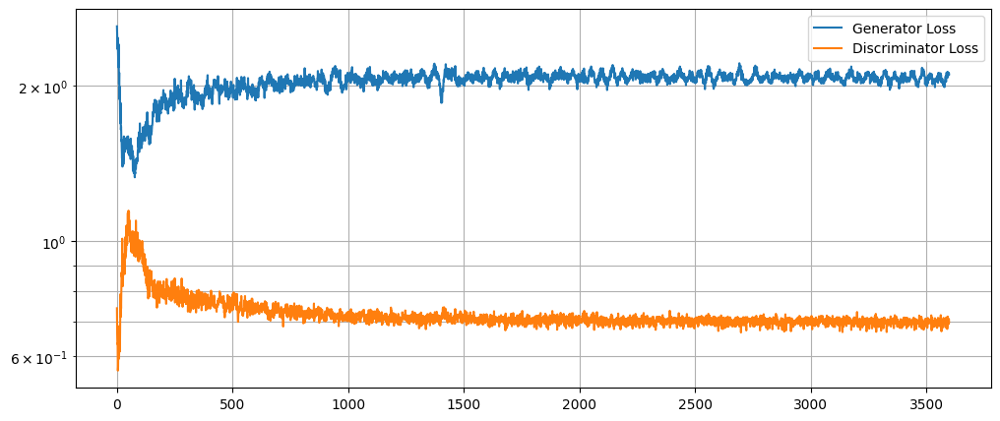

In [12]:
plt.figure(figsize=(12, 5))
plt.semilogy(*zip(*gen_step_loss), label="Generator Loss")
plt.semilogy(*zip(*disc_step_loss), label="Discriminator Loss")
plt.grid(True, "both", "both")
plt.legend()

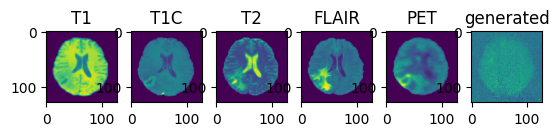

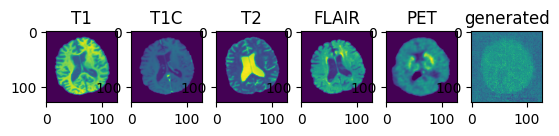

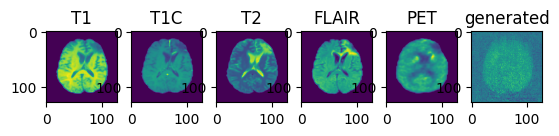

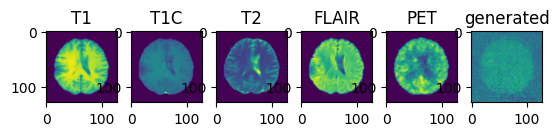

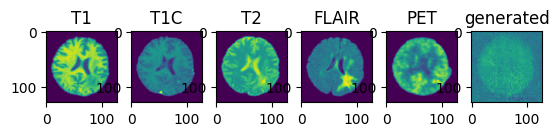

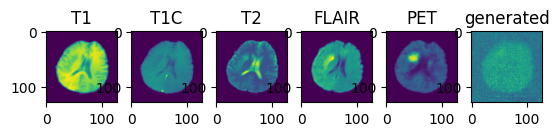

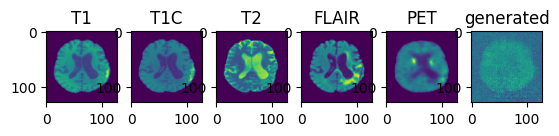

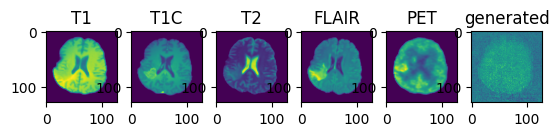

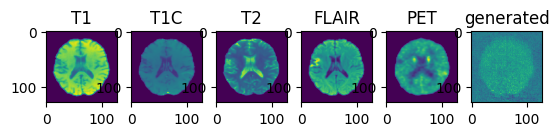

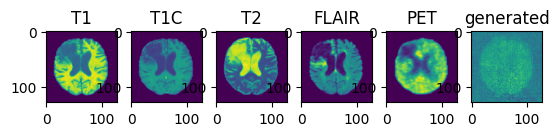

It has been 31682.90693616867 seconds since the loop started
validation avg MS-SSIM: 0.3501 validation avg MSE 0.0000


In [13]:

slice_index = 32

torch.cuda.empty_cache()

saved_dict = torch.load("best_metric_glagan.pth")
gen_net.load_state_dict(saved_dict['model_state_dict'])
gen_net.eval()

ms_ssim = []
ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)

for item in check_DataLoader:

    with torch.no_grad():
        
        input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        generated = gen_net(input_images)
        
        image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
        f, axarr = plt.subplots(1, 6)

        ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
        axarr[0].imshow(image_datas[0])
        axarr[0].set_title("T1")
        axarr[1].imshow(image_datas[1])
        axarr[1].set_title("T1C")
        axarr[2].imshow(image_datas[2])
        axarr[2].set_title("T2")
        axarr[3].imshow(image_datas[3])
        axarr[3].set_title("FLAIR")
        axarr[4].imshow(image_datas[4])
        axarr[4].set_title("PET")
        axarr[5].imshow(image_datas[5].cpu())
        axarr[5].set_title("generated")
        plt.show()


now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

print("validation avg MS-SSIM: {:.4f} validation avg MSE {:.4f}".format(torch.mean(torch.FloatTensor(ms_ssim)), 0))